# <div class = 'alert alert-info'> Front - Customer Queries</div>

In [6]:
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# importing decomposition modules
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation

# importing Natural Language Toolkit and other NLP modules
import nltk
from nltk.stem import WordNetLemmatizer
from textblob import TextBlob, Word
from nltk.corpus import stopwords
import re

In [1]:
import warnings

In [2]:
warnings.filterwarnings('ignore')

# <div class = 'alert alert-info'> Messages Dataset </div>

In [7]:
df = pd.read_csv('/Users/rajathadri_as/Documents/export-messages-fmg-2023-12-12-346d-a7c7ec.csv')

In [8]:
pd.set_option('display.max_columns',None)

In [9]:
df.head(5)

,Message ID,Conversation ID,Segment,Direction,Status,Inbox,Inbox API ID,Message date,Autoreply,Reaction time,Total reply time,Handle time,Response time,Attributed to,Assignee,Author,Contact name,Contact handle,Account names,To,Cc,Bcc,Extract,Tags,Tag API IDs,Message API ID,Conversation API ID,New Conversation,First response,Business hours,Subject,Segment start,Segment end,Segment closed,Last segment activity
0,34813192388,22159694404,1,Inbound,Open,Email - Horseclicks,inb_lt42,2023-01-01 01:30:18,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,K B,kabloom@penn.com,NaN,info@horseclicks.com,NaN,NaN,I apologize for this automatic reply to your e...,Horseclicks,tag_3dfgy,msg_fzqvj5w,cnv_a6hb5ms,1,0,0,Re: Ad alert - it's a match!,2023-01-01 01:30:18,NaN,NaN,NaN
1,34813192388,22159694404,1,Inbound,Open,Email - Internet Support,inb_lt16,2023-01-01 01:30:18,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,K B,kabloom@penn.com,NaN,info@horseclicks.com,NaN,NaN,I apologize for this automatic reply to your e...,Horseclicks,tag_3dfgy,msg_fzqvj5w,cnv_a6hb5ms,1,0,0,Re: Ad alert - it's a match!,2023-01-01 01:30:18,NaN,NaN,NaN
2,34813215620,22159708932,1,Inbound,Archived,Live Chat - FAD,inb_4lre,2023-01-01 01:41:41,0,NaN,NaN,NaN,NaN,support,NaN,NaN,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,NaN,446d1708-f53c-11e7-934b-832da75fc149,NaN,NaN,Hi. How long does it usually take for an ad to...,"FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",msg_fzqw138,cnv_a6hbguc,1,0,0,NaN,2023-01-01 01:41:41,NaN,NaN,NaN
3,34813215748,22159708932,1,Outbound,Archived,Live Chat - FAD,inb_4lre,2023-01-01 01:41:42,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,NaN,NaN,"Hi, thanks for contacting us, sorry but we are...","FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",msg_fzqw16s,cnv_a6hbguc,0,0,0,NaN,2023-01-01 01:41:41,NaN,NaN,NaN
4,34813216580,22159708932,1,Inbound,Archived,Live Chat - FAD,inb_4lre,2023-01-01 01:42:03,0,NaN,NaN,NaN,NaN,support,NaN,NaN,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,NaN,446d1708-f53c-11e7-934b-832da75fc149,NaN,NaN,User submitted their email: lensijex067@gmail.com,"FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",msg_fzqw1tw,cnv_a6hbguc,0,0,0,NaN,2023-01-01 01:41:41,NaN,NaN,NaN


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64533 entries, 0 to 64532
Data columns (total 35 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Message ID             64533 non-null  int64  
 1   Conversation ID        64533 non-null  int64  
 2   Segment                64533 non-null  int64  
 3   Direction              64533 non-null  object 
 4   Status                 64533 non-null  object 
 5   Inbox                  64533 non-null  object 
 6   Inbox API ID           64533 non-null  object 
 7   Message date           64533 non-null  object 
 8   Autoreply              64533 non-null  int64  
 9   Reaction time          11098 non-null  float64
 10  Total reply time       6193 non-null   float64
 11  Handle time            31212 non-null  float64
 12  Response time          11105 non-null  float64
 13  Attributed to          59800 non-null  object 
 14  Assignee               20 non-null     object 
 15  Au

In [11]:
df.shape

(64533, 35)

In [12]:
df.isnull().sum()

Message ID                   0
Conversation ID              0
Segment                      0
Direction                    0
Status                       0
Inbox                        0
Inbox API ID                 0
Message date                 0
Autoreply                    0
Reaction time            53435
Total reply time         58340
Handle time              33321
Response time            53428
Attributed to             4733
Assignee                 64513
Author                   32917
Contact name              9274
Contact handle               0
Account names            64533
To                          26
Cc                       64430
Bcc                      64523
Extract                    821
Tags                       415
Tag API IDs                415
Message API ID               0
Conversation API ID          0
New Conversation             0
First response               0
Business hours               0
Subject                  15067
Segment start                0
Segment 

In [13]:
df.drop(['Reaction time','Total reply time','Handle time','Response time','Assignee','Author','Account names','Cc','Bcc'], axis=1, inplace = True)

In [14]:
df.head()

,Message ID,Conversation ID,Segment,Direction,Status,Inbox,Inbox API ID,Message date,Autoreply,Attributed to,Contact name,Contact handle,To,Extract,Tags,Tag API IDs,Message API ID,Conversation API ID,New Conversation,First response,Business hours,Subject,Segment start,Segment end,Segment closed,Last segment activity
0,34813192388,22159694404,1,Inbound,Open,Email - Horseclicks,inb_lt42,2023-01-01 01:30:18,0,NaN,K B,kabloom@penn.com,info@horseclicks.com,I apologize for this automatic reply to your e...,Horseclicks,tag_3dfgy,msg_fzqvj5w,cnv_a6hb5ms,1,0,0,Re: Ad alert - it's a match!,2023-01-01 01:30:18,NaN,NaN,NaN
1,34813192388,22159694404,1,Inbound,Open,Email - Internet Support,inb_lt16,2023-01-01 01:30:18,0,NaN,K B,kabloom@penn.com,info@horseclicks.com,I apologize for this automatic reply to your e...,Horseclicks,tag_3dfgy,msg_fzqvj5w,cnv_a6hb5ms,1,0,0,Re: Ad alert - it's a match!,2023-01-01 01:30:18,NaN,NaN,NaN
2,34813215620,22159708932,1,Inbound,Archived,Live Chat - FAD,inb_4lre,2023-01-01 01:41:41,0,support,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,446d1708-f53c-11e7-934b-832da75fc149,Hi. How long does it usually take for an ad to...,"FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",msg_fzqw138,cnv_a6hbguc,1,0,0,NaN,2023-01-01 01:41:41,NaN,NaN,NaN
3,34813215748,22159708932,1,Outbound,Archived,Live Chat - FAD,inb_4lre,2023-01-01 01:41:42,1,NaN,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,a0a6f72b-f358-4799-bc80-8cae83f9c123,"Hi, thanks for contacting us, sorry but we are...","FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",msg_fzqw16s,cnv_a6hbguc,0,0,0,NaN,2023-01-01 01:41:41,NaN,NaN,NaN
4,34813216580,22159708932,1,Inbound,Archived,Live Chat - FAD,inb_4lre,2023-01-01 01:42:03,0,support,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,446d1708-f53c-11e7-934b-832da75fc149,User submitted their email: lensijex067@gmail.com,"FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",msg_fzqw1tw,cnv_a6hbguc,0,0,0,NaN,2023-01-01 01:41:41,NaN,NaN,NaN


In [15]:
list(df['Extract'])

['I apologize for this automatic reply to your email. To control spam, I now allow incoming messages only from senders I have approved beforehand. If you would like to be added to my list of approved se',
 'I apologize for this automatic reply to your email. To control spam, I now allow incoming messages only from senders I have approved beforehand. If you would like to be added to my list of approved se',
 'Hi. How long does it usually take for an ad to be reviewed?',
 "Hi, thanks for contacting us, sorry but we are now out of the office, however, if you leave us your name, advert reference, & email address with a brief description of how we can help we'll get back i",
 'User submitted their email: lensijex067@gmail.com',
 "Hi, thanks for contacting us, sorry but we are now out of the office, however, if you leave us your name, advert reference, & email address with a brief description of how we can help we'll get back i",
 "Hi, thanks for contacting us, sorry but we are now out of th

In [16]:
df['Message date'] = pd.to_datetime(df['Message date'])

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64533 entries, 0 to 64532
Data columns (total 26 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Message ID             64533 non-null  int64         
 1   Conversation ID        64533 non-null  int64         
 2   Segment                64533 non-null  int64         
 3   Direction              64533 non-null  object        
 4   Status                 64533 non-null  object        
 5   Inbox                  64533 non-null  object        
 6   Inbox API ID           64533 non-null  object        
 7   Message date           64533 non-null  datetime64[ns]
 8   Autoreply              64533 non-null  int64         
 9   Attributed to          59800 non-null  object        
 10  Contact name           55259 non-null  object        
 11  Contact handle         64533 non-null  object        
 12  To                     64507 non-null  object        
 13  E

In [18]:
df['Inbox'].value_counts()

Inbox
Live Chat - FAD             23690
Callbacks                    7171
Email - FAD                  6337
Live Chat - Wightbay         6110
Email - Internet Support     3030
Email - Gunstar              2793
Live Chat - Caravans         2738
Live Chat - Gunstar          2386
Live Chat - Horsemart        2268
Email - Horseclicks          2094
Email - Caravans             1668
Email - Horsemart            1497
Live Chat - Horseclicks       617
Email - Wightbay              612
Email - UpCountry             552
Email - Birdtrader            510
Email - Dogs & Puppies        241
Email - Kitten Ads            175
Spidersnet - 999               24
Spidersnet Support             19
Email - BS24Support             1
Name: count, dtype: int64

In [19]:
df_fadlive = df[df['Inbox']=='Live Chat - FAD']

In [20]:
df_fadlive.shape

(23690, 26)

In [21]:
df_fadmail = df[df['Inbox']=='Email - FAD']

In [22]:
df_fadmail.shape

(6337, 26)

In [23]:
df_fadlive.head()

,Message ID,Conversation ID,Segment,Direction,Status,Inbox,Inbox API ID,Message date,Autoreply,Attributed to,Contact name,Contact handle,To,Extract,Tags,Tag API IDs,Message API ID,Conversation API ID,New Conversation,First response,Business hours,Subject,Segment start,Segment end,Segment closed,Last segment activity
2,34813215620,22159708932,1,Inbound,Archived,Live Chat - FAD,inb_4lre,2023-01-01 01:41:41,0,support,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,446d1708-f53c-11e7-934b-832da75fc149,Hi. How long does it usually take for an ad to...,"FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",msg_fzqw138,cnv_a6hbguc,1,0,0,NaN,2023-01-01 01:41:41,NaN,NaN,NaN
3,34813215748,22159708932,1,Outbound,Archived,Live Chat - FAD,inb_4lre,2023-01-01 01:41:42,1,NaN,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,a0a6f72b-f358-4799-bc80-8cae83f9c123,"Hi, thanks for contacting us, sorry but we are...","FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",msg_fzqw16s,cnv_a6hbguc,0,0,0,NaN,2023-01-01 01:41:41,NaN,NaN,NaN
4,34813216580,22159708932,1,Inbound,Archived,Live Chat - FAD,inb_4lre,2023-01-01 01:42:03,0,support,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,446d1708-f53c-11e7-934b-832da75fc149,User submitted their email: lensijex067@gmail.com,"FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",msg_fzqw1tw,cnv_a6hbguc,0,0,0,NaN,2023-01-01 01:41:41,NaN,NaN,NaN
5,34813216644,22159708932,1,Outbound,Archived,Live Chat - FAD,inb_4lre,2023-01-01 01:42:04,1,NaN,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,a0a6f72b-f358-4799-bc80-8cae83f9c123,"Hi, thanks for contacting us, sorry but we are...","FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",msg_fzqw1vo,cnv_a6hbguc,0,0,0,NaN,2023-01-01 01:41:41,NaN,NaN,NaN
8,34813360196,22159805444,1,Inbound,Archived,Live Chat - FAD,inb_4lre,2023-01-01 02:45:13,0,support,Tangerine Egret,6cdbe2b4-7fa2-4a3e-96d0-ac171e8f841c,446d1708-f53c-11e7-934b-832da75fc149,Pushy licker,"FAD,Other,Syed Muhammad","tag_1sbs2,tag_41610,tag_i5kxw",msg_fzqz4n8,cnv_a6hdjb8,1,0,0,NaN,2023-01-01 02:45:13,NaN,NaN,NaN


In [24]:
df_fadchats = df_fadlive[['Message ID','Extract']]

In [25]:
df_fadchats.head()

,Message ID,Extract
2,34813215620,Hi. How long does it usually take for an ad to...
3,34813215748,"Hi, thanks for contacting us, sorry but we are..."
4,34813216580,User submitted their email: lensijex067@gmail.com
5,34813216644,"Hi, thanks for contacting us, sorry but we are..."
8,34813360196,Pushy licker


In [26]:
# Lemmatize
lemmatizer = WordNetLemmatizer()

In [27]:
corpus = []

text = list(df_fadlive['Extract'])

for i in range(len(text)):
    r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
    r = r.lower()
    r = r.split()
    r = [word for word in r if word not in stopwords.words('english')]
    r = [lemmatizer.lemmatize(word) for word in r]
    r = ' '.join(r)
    corpus.append(r)

In [28]:
corpus

['hi long usually take ad reviewed',
 'hi thanks contacting u sorry office however leave u name advert reference email address brief description help get back',
 'user submitted email lensijex gmail com',
 'hi thanks contacting u sorry office however leave u name advert reference email address brief description help get back',
 'pushy licker',
 'hi thanks contacting u sorry office however leave u name advert reference email address brief description help get back',
 'scam',
 'seem move next page',
 'bgroom virgin medium com',
 'user submitted email bgroom virginmedia com',
 'hi apply',
 'want become escort',
 'ale barboza icloud com',
 'hey change location help change price help',
 'hi thanks contacting u sorry office however leave u name advert reference email address brief description help get back',
 'friendlylisa gmail com',
 'hi thanks contacting u sorry office however leave u name advert reference email address brief description help get back',
 'need change colnbrook slough',
 '

In [29]:
from collections import Counter  
  
# counts word frequency 
def count_words(text):                   
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = {}  
    for word in text.split(" "):  
        if word in word_counts:  
            word_counts[word]+= 1 
        else:  
            word_counts[word]= 1 
    return word_counts

In [30]:
def count_words_fast(text):      
    text = text.lower()  
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = Counter(text.split(" "))  
    return word_counts  

In [31]:
count_words(corpus[0])

{'hi': 1, 'long': 1, 'usually': 1, 'take': 1, 'ad': 1, 'reviewed': 1}

In [32]:
df_fadlive['Length'] = df_fadlive['Extract'].str.len()

In [33]:
df_fadlive.head()

,Message ID,Conversation ID,Segment,Direction,Status,Inbox,Inbox API ID,Message date,Autoreply,Attributed to,Contact name,Contact handle,To,Extract,Tags,Tag API IDs,Message API ID,Conversation API ID,New Conversation,First response,Business hours,Subject,Segment start,Segment end,Segment closed,Last segment activity,Length
2,34813215620,22159708932,1,Inbound,Archived,Live Chat - FAD,inb_4lre,2023-01-01 01:41:41,0,support,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,446d1708-f53c-11e7-934b-832da75fc149,Hi. How long does it usually take for an ad to...,"FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",msg_fzqw138,cnv_a6hbguc,1,0,0,NaN,2023-01-01 01:41:41,NaN,NaN,NaN,59.0
3,34813215748,22159708932,1,Outbound,Archived,Live Chat - FAD,inb_4lre,2023-01-01 01:41:42,1,NaN,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,a0a6f72b-f358-4799-bc80-8cae83f9c123,"Hi, thanks for contacting us, sorry but we are...","FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",msg_fzqw16s,cnv_a6hbguc,0,0,0,NaN,2023-01-01 01:41:41,NaN,NaN,NaN,200.0
4,34813216580,22159708932,1,Inbound,Archived,Live Chat - FAD,inb_4lre,2023-01-01 01:42:03,0,support,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,446d1708-f53c-11e7-934b-832da75fc149,User submitted their email: lensijex067@gmail.com,"FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",msg_fzqw1tw,cnv_a6hbguc,0,0,0,NaN,2023-01-01 01:41:41,NaN,NaN,NaN,49.0
5,34813216644,22159708932,1,Outbound,Archived,Live Chat - FAD,inb_4lre,2023-01-01 01:42:04,1,NaN,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,a0a6f72b-f358-4799-bc80-8cae83f9c123,"Hi, thanks for contacting us, sorry but we are...","FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",msg_fzqw1vo,cnv_a6hbguc,0,0,0,NaN,2023-01-01 01:41:41,NaN,NaN,NaN,200.0
8,34813360196,22159805444,1,Inbound,Archived,Live Chat - FAD,inb_4lre,2023-01-01 02:45:13,0,support,Tangerine Egret,6cdbe2b4-7fa2-4a3e-96d0-ac171e8f841c,446d1708-f53c-11e7-934b-832da75fc149,Pushy licker,"FAD,Other,Syed Muhammad","tag_1sbs2,tag_41610,tag_i5kxw",msg_fzqz4n8,cnv_a6hdjb8,1,0,0,NaN,2023-01-01 02:45:13,NaN,NaN,NaN,13.0


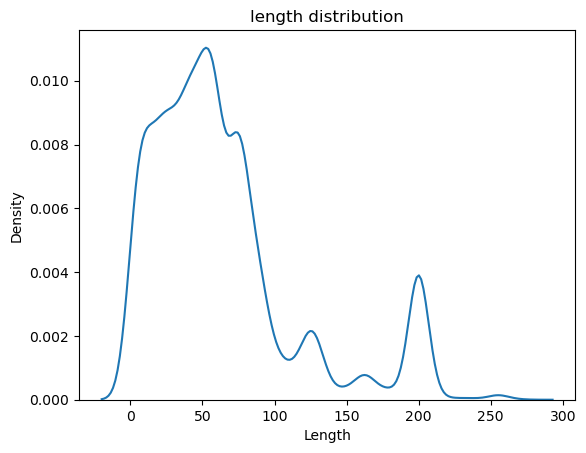

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure()
sns.kdeplot(x= df_fadlive['Length'],data = df_fadlive).set_title('length distribution')
plt.show()

In [35]:
df_fadlive_150 = df_fadlive[df_fadlive['Length'] >= 150]

In [36]:
df_fadlive_051 = df_fadlive[df_fadlive['Length'] < 150]

In [37]:
df_fadlive_150['Direction'].value_counts()

Direction
Outbound    1954
Inbound      234
Name: count, dtype: int64

In [38]:
1954/234

8.350427350427351

In [39]:
df_fadlive_051['Direction'].value_counts()

Direction
Outbound    12559
Inbound      8684
Name: count, dtype: int64

In [40]:
12559/8684

1.4462229387379089

In [41]:
df_fadlive_150['New Conversation'].value_counts()

New Conversation
0    2101
1      87
Name: count, dtype: int64

In [42]:
df_fadlive_051['New Conversation'].value_counts()

New Conversation
0    19703
1     1540
Name: count, dtype: int64

In [43]:
df_fadlive['Direction'].value_counts()

Direction
Outbound    14592
Inbound      9098
Name: count, dtype: int64

In [44]:
df_fadmail['Direction'].value_counts()

Direction
Inbound     3470
Outbound    2867
Name: count, dtype: int64

In [45]:
# Most frequent terms

def get_top_n_words(n_top_words, count_vectorizer, text_data):
    '''
    The function returns a tuple of the top n words in a sample and their 
    accompanying counts, given a CountVectorizer object and text sample as inputs
    '''
    # encoding the document using countvectorizer object
    vectorized_content = count_vectorizer.fit_transform(text_data.values)
    vectorized_total = np.sum(vectorized_content, axis=0)

    # extracting specifics for words
    word_indices = np.flip(np.argsort(vectorized_total)[0,:], 1)
    word_values = np.flip(np.sort(vectorized_total)[0,:],1)

    # creating a vector matrix for words
    word_vectors = np.zeros((n_top_words, vectorized_content.shape[1]))
    for i in range(n_top_words):
        word_vectors[i,word_indices[0,i]] = 1

    # display Vector matrix
    print(word_vectors)

    # collect the words
    words = [word[0].encode('ascii').decode('utf-8') for 
             word in count_vectorizer.inverse_transform(word_vectors)]

    return (words, word_values[0,:n_top_words].tolist()[0])

In [46]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\rajathadri_as\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [47]:
stpwrd = nltk.corpus.stopwords.words('english')

stpwrd[:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [48]:
count_vectorizer = CountVectorizer(stop_words=stpwrd)

In [49]:
counts = count_vectorizer.fit_transform(corpus)

In [50]:
counts_df =  pd.DataFrame(counts.toarray(), columns = count_vectorizer.get_feature_names_out())
counts_df.head()

aa  aalexarebeca  ab  abarnard  abdul  aberdeen  ability  able  absolutely  \
0   0             0   0         0      0         0        0     0           0   
1   0             0   0         0      0         0        0     0           0   
2   0             0   0         0      0         0        0     0           0   
3   0             0   0         0      0         0        0     0           0   
4   0             0   0         0      0         0        0     0           0   

   ac  acc  accept  accepted  accepting  acces  access  accessing  accessory  \
0   0    0       0         0          0      0       0          0          0   
1   0    0       0         0          0      0       0          0          0   
2   0    0       0         0          0      0       0          0          0   
3   0    0       0         0          0      0       0          0          0   
4   0    0       0         0          0      0       0          0          0   

   accidentally  accidentlally  acconts  according  accordingly  accou  \
0             0              0        0          0            0      0   
1             0              0        0          0            0      0   
2             0              0        0          0            0      0   
3             0              0        0          0            0      0   
4             0              0        0          0            0      0   

   account  accountant  accout  acctualy  aceasi  acest  acornrent  acount  \
0        0           0       0         0       0      0          0       0   
1        0           0       0         0       0      0          0       0   
2        0           0       0         0       0      0          0       0   
3        0           0       0         0       0      0          0       0   
4        0           0       0         0       0      0          0       0   

   across  action  actionfraud  activate  activated  activation  active  \
0       0       0            0         0          0           0       0   
1       0       0            0         0          0           0       0   
2       0       0            0         0          0           0       0   
3       0       0            0         0          0           0       0   
4       0       0            0         0          0           0       0   

   activity  actual  actually  acvount  ad  adam  adamcharlesjohns  add  \
0         0       0         0        0   1     0                 0    0   
1         0       0         0        0   0     0                 0    0   
2         0       0         0        0   0     0                 0    0   
3         0       0         0        0   0     0                 0    0   
4         0       0         0        0   0     0                 0    0   

   added  addf  adding  addition  additional  additionally  addlestone  addm  \
0      0     0       0         0           0             0           0     0   
1      0     0       0         0           0             0           0     0   
2      0     0       0         0           0             0           0     0   
3      0     0       0         0           0             0           0     0   
4      0     0       0         0           0             0           0     0   

   addrees  address  adeagbemuko  adelaalima  adf  adjustable  admission  \
0        0        0            0           0    0           0          0   
1        0        1            0           0    0           0          0   
2        0        0            0           0    0           0          0   
3        0        1            0           0    0           0          0   
4        0        0            0           0    0           0          0   

   admit  admits  adores  adreess  adresa  adrese  adress  adrwert  adsnow  \
0      0       0       0        0       0       0       0        0       0   
1      0       0       0        0       0       0       0        0       0   
2      0       0       0        0       0      

In [51]:
# counting terms
counts_dict = {}

# Store the words as key-value pairs
for ii, word in enumerate(counts_df.columns):
    counts_dict[word] = sum(counts_df[str(word)])
    word_count = [(i,count) for i,count in list(zip(counts_dict.keys(), counts_dict.values()))]

In [52]:
sorted_counts = sorted(word_count, key = lambda x: x[1], reverse = True)
sorted_counts[:40]

[('help', 4899),
 ('thank', 4285),
 ('please', 3779),
 ('ad', 3623),
 ('hi', 3567),
 ('name', 3177),
 ('email', 2892),
 ('contacting', 2637),
 ('address', 2298),
 ('advert', 2126),
 ('thanks', 2021),
 ('sorry', 1846),
 ('back', 1802),
 ('live', 1715),
 ('get', 1626),
 ('however', 1622),
 ('day', 1600),
 ('detail', 1560),
 ('bye', 1515),
 ('reference', 1497),
 ('description', 1411),
 ('leave', 1411),
 ('else', 1399),
 ('office', 1381),
 ('brief', 1373),
 ('assist', 1291),
 ('hello', 1198),
 ('syed', 1135),
 ('welcome', 1065),
 ('anything', 1064),
 ('com', 1023),
 ('need', 905),
 ('concern', 873),
 ('message', 873),
 ('sharing', 795),
 ('service', 765),
 ('happy', 737),
 ('nice', 722),
 ('good', 711),
 ('see', 653)]

In [53]:
df_fadlive_inbound = df_fadlive[df_fadlive['Direction']=='Inbound']

In [54]:
corpus = []

text = list(df_fadlive_inbound['Extract'])

for i in range(len(text)):
    r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
    r = r.lower()
    r = r.split()
    r = [word for word in r if word not in stopwords.words('english')]
    r = [lemmatizer.lemmatize(word) for word in r]
    r = ' '.join(r)
    corpus.append(r)

In [55]:
count_vectorizer = CountVectorizer(stop_words=stpwrd)

In [56]:
counts = count_vectorizer.fit_transform(corpus)

In [57]:
counts_df =  pd.DataFrame(counts.toarray(), columns = count_vectorizer.get_feature_names_out())
counts_df.head()

aa  aalexarebeca  ab  abarnard  abdul  aberdeen  ability  able  absolutely  \
0   0             0   0         0      0         0        0     0           0   
1   0             0   0         0      0         0        0     0           0   
2   0             0   0         0      0         0        0     0           0   
3   0             0   0         0      0         0        0     0           0   
4   0             0   0         0      0         0        0     0           0   

   ac  acc  accept  accepted  accepting  acces  access  accidentally  \
0   0    0       0         0          0      0       0             0   
1   0    0       0         0          0      0       0             0   
2   0    0       0         0          0      0       0             0   
3   0    0       0         0          0      0       0             0   
4   0    0       0         0          0      0       0             0   

   accidentlally  acconts  accou  account  accountant  accout  acctualy  \
0              0        0      0        0           0       0         0   
1              0        0      0        0           0       0         0   
2              0        0      0        0           0       0         0   
3              0        0      0        0           0       0         0   
4              0        0      0        0           0       0         0   

   aceasi  acest  across  action  activate  activated  activation  active  \
0       0      0       0       0         0          0           0       0   
1       0      0       0       0         0          0           0       0   
2       0      0       0       0         0          0           0       0   
3       0      0       0       0         0          0           0       0   
4       0      0       0       0         0          0           0       0   

   actual  actually  acvount  ad  adam  adamcharlesjohns  add  added  addf  \
0       0         0        0   1     0                 0    0      0     0   
1       0         0        0   0     0                 0    0      0     0   
2       0         0        0   0     0                 0    0      0     0   
3       0         0        0   0     0                 0    0      0     0   
4       0         0        0   0     0                 0    0      0     0   

   adding  additional  addlestone  addm  address  adeagbemuko  adelaalima  \
0       0           0           0     0        0            0           0   
1       0           0           0     0        0            0           0   
2       0           0           0     0        0            0           0   
3       0           0           0     0        0            0           0   
4       0           0           0     0        0            0           0   

   adf  adjustable  admission  admit  admits  adresa  adrese  adress  adrwert  \
0    0           0          0      0       0       0       0       0        0   
1    0           0          0      0       0       0       0       0        0   
2    0           0          0      0       0       0       0       0        0   
3    0           0          0      0       0       0       0       0        0   
4    0           0          0      0       0       0       0       0        0   

   adsnow  adult  adultseek  adv  advance  adver  adverise  advert  advertise  \
0       0      0          0    0        0      0         0       0          0   
1       0      0          0    0        0      0         0       0          0   
2       0      0          0    0        0      0         0       0          0   
3       0      0          0    0        0      0         0       0          0   
4       0      0          0    0        0      0         0       0          0   

   advertised  advertisement  advertiser  advertising  advertisment  advice  \
0           0              0           0            0             0       0   
1           0              0           0            0             0       0   
2           0             

In [58]:
# counting terms
counts_dict = {}

# Store the words as key-value pairs
for ii, word in enumerate(counts_df.columns):
    counts_dict[word] = sum(counts_df[str(word)])
    word_count = [(i,count) for i,count in list(zip(counts_dict.keys(), counts_dict.values()))]

In [59]:
sorted_counts = sorted(word_count, key = lambda x: x[1], reverse = True)
sorted_counts[:40]

[('ad', 1253),
 ('com', 969),
 ('hi', 660),
 ('please', 635),
 ('thank', 599),
 ('gmail', 596),
 ('ok', 558),
 ('hello', 541),
 ('thanks', 484),
 ('ff', 458),
 ('email', 423),
 ('advert', 382),
 ('want', 316),
 ('change', 288),
 ('add', 284),
 ('help', 280),
 ('yes', 279),
 ('live', 255),
 ('one', 227),
 ('put', 217),
 ('need', 213),
 ('day', 192),
 ('paid', 189),
 ('ref', 184),
 ('number', 182),
 ('nan', 180),
 ('time', 175),
 ('account', 174),
 ('photo', 171),
 ('renew', 168),
 ('like', 166),
 ('still', 166),
 ('see', 164),
 ('user', 161),
 ('submitted', 156),
 ('good', 155),
 ('pay', 149),
 ('place', 146),
 ('know', 142),
 ('location', 142)]

In [60]:
df_fadlive['Message ID'].nunique()

23690

In [61]:
df_fadlive['Conversation ID'].nunique()

1649

In [62]:
23690/1649

14.366282595512432

In [63]:
df_fadlive_inbound['Message ID'].nunique()

9098

In [64]:
df_fadlive_inbound['Conversation ID'].nunique()

1642

In [65]:
9098/1642

5.540803897685749

In [66]:
df_fadlive['Length'].value_counts()

Length
200.0    1535
76.0     1199
54.0      767
40.0      646
50.0      643
         ... 
214.0       1
222.0       1
233.0       1
263.0       1
189.0       1
Name: count, Length: 244, dtype: int64

In [67]:
df_temp = df_fadlive[df_fadlive['Length']==200]

In [68]:
list(df_temp['Extract'])

["Hi, thanks for contacting us, sorry but we are now out of the office, however, if you leave us your name, advert reference, & email address with a brief description of how we can help we'll get back i",
 "Hi, thanks for contacting us, sorry but we are now out of the office, however, if you leave us your name, advert reference, & email address with a brief description of how we can help we'll get back i",
 "Hi, thanks for contacting us, sorry but we are now out of the office, however, if you leave us your name, advert reference, & email address with a brief description of how we can help we'll get back i",
 "Hi, thanks for contacting us, sorry but we are now out of the office, however, if you leave us your name, advert reference, & email address with a brief description of how we can help we'll get back i",
 "Hi, thanks for contacting us, sorry but we are now out of the office, however, if you leave us your name, advert reference, & email address with a brief description of how we can

In [69]:
df_temp = df_fadlive[df_fadlive['Length']==76]

In [70]:
list(df_temp['Extract'])

['Please share your email address or Ad ref so that I can pull out the details',
 'Please share your email address or Ad ref so that I can pull out the details',
 'Please share your email address or Ad ref so that I can pull out the details',
 'Please share your email address or Ad ref so that I can pull out the details',
 'Please share your email address or Ad ref so that I can pull out the details',
 'Please share your email address or Ad ref so that I can pull out the details',
 "I had a Free Advert but suddenlt it's gone and I can no longer find it - why",
 'If you want an upsell like boost and priority ad you need to pay separately ',
 'Please share your email address or Ad ref so that I can pull out the details',
 'Please share your email address or Ad ref so that I can pull out the details',
 'Thank you, please hold while I review the details against your email address',
 'Please share your email address or Ad ref so that I can pull out the details',
 'Please share your email ad

# Email - FAD

In [71]:
corpus = []

text = list(df_fadmail['Extract'])

for i in range(len(text)):
    r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
    r = r.lower()
    r = r.split()
    r = [word for word in r if word not in stopwords.words('english')]
    r = [lemmatizer.lemmatize(word) for word in r]
    r = ' '.join(r)
    corpus.append(r)

In [72]:
corpus

['hi thanks contacting u sorry office however leave u name advert reference email address brief description help get back',
 'permitted post nude photo private bit visible advertiser profile sun jan fmg support friday ad co uk wrote hi thanks contacting u sorry',
 'notified rule sn spidersnet conversation ebay feed fault strafford car fraser strafford co uk inbox spidersnet fraser strafford co uk ebay feed fault',
 'please someone let know advert updated gone live add tagged ref num respond regular email thankyou faith edmonds craig',
 'asked reminded ad ref ht pre friend sale inbox callback pre friend sale ad ref ht postal code thu dec suppor',
 'notified rule sn spidersnet conversation ebay feed fault strafford car fraser strafford co uk inbox spidersnet fraser strafford co uk ebay feed fault',
 'notified rule sn spidersnet conversation ebay feed fault strafford car spidersnet co uk inbox spidersnet spidersnet co uk ebay feed fa',
 'notified rule sn spidersnet conversation ebay feed 

In [73]:
from collections import Counter  
  
# counts word frequency 
def count_words(text):                   
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = {}  
    for word in text.split(" "):  
        if word in word_counts:  
            word_counts[word]+= 1 
        else:  
            word_counts[word]= 1 
    return word_counts

In [74]:
def count_words_fast(text):      
    text = text.lower()  
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = Counter(text.split(" "))  
    return word_counts  

In [75]:
count_words(corpus[0])

{'hi': 1,
 'thanks': 1,
 'contacting': 1,
 'u': 2,
 'sorry': 1,
 'office': 1,
 'however': 1,
 'leave': 1,
 'name': 1,
 'advert': 1,
 'reference': 1,
 'email': 1,
 'address': 1,
 'brief': 1,
 'description': 1,
 'help': 1,
 'get': 1,
 'back': 1}

In [76]:
df_fadmail['Length'] = df_fadmail['Extract'].str.len()

In [77]:
df_fadmail.head()

,Message ID,Conversation ID,Segment,Direction,Status,Inbox,Inbox API ID,Message date,Autoreply,Attributed to,Contact name,Contact handle,To,Extract,Tags,Tag API IDs,Message API ID,Conversation API ID,New Conversation,First response,Business hours,Subject,Segment start,Segment end,Segment closed,Last segment activity,Length
6,34813226820,22159717124,1,Outbound,Archived,Email - FAD,inb_f6oy,2023-01-01 01:47:06,0,NaN,NaN,lensijex067@gmail.com,lensijex067@gmail.com,"Hi, thanks for contacting us, sorry but we are...","Ashfaq Ahmad,Placing Advert query / Rebook,Other","tag_ifudg,tag_462o4,tag_41610",msg_fzqw9qc,cnv_a6hbn5w,1,0,0,Re: Hi. How long does it usually t…,2023-01-01 01:47:06,NaN,NaN,NaN,200.0
7,34813321988,22159717124,1,Inbound,Archived,Email - FAD,inb_f6oy,2023-01-01 02:27:28,0,support,NaN,lensijex067@gmail.com,support@friday-ad.co.uk,Is it permitted to post a nude photo (no priva...,"Ashfaq Ahmad,Placing Advert query / Rebook,Other","tag_ifudg,tag_462o4,tag_41610",msg_fzqyb5w,cnv_a6hbn5w,0,0,0,Re: Hi. How long does it usually t…,2023-01-01 01:47:06,NaN,NaN,NaN,200.0
52,34818072388,22162438148,1,Inbound,Archived,Email - FAD,inb_f6oy,2023-01-01 22:09:42,0,support,NaN,hello@frontapp.com,support@friday-ad.co.uk,You were notified by rule SN - Spidersnet 999 ...,Other,tag_41610,msg_fzts4lg,cnv_a6ixypw,1,0,0,Notification from SN - Spidersnet 999,2023-01-01 22:09:42,NaN,NaN,NaN,200.0
103,34825428036,22166507012,1,Inbound,Archived,Email - FAD,inb_f6oy,2023-01-02 13:05:21,0,support,Faith,ebonyandfaithforever@gmail.com,support@friday-ad.co.uk,Please can someone let me know why my advert h...,"Ashfaq Ahmad,Why is my ad not live","tag_ifudg,tag_415ok",msg_fzy5s90,cnv_a6ld69w,1,0,1,Re: Advert still in review,2023-01-02 13:05:21,NaN,NaN,NaN,184.0
106,34826354052,22167036036,1,Inbound,Archived,Email - FAD,inb_f6oy,2023-01-02 14:00:47,0,support,NaN,hello@frontapp.com,support@friday-ad.co.uk,You asked to be reminded about Re: ad ref. HT2...,"FAD,Other","tag_1sbs2,tag_41610",msg_fzypmro,cnv_a6loih0,1,0,1,Reminder about a conversation with Pre Friends...,2023-01-02 14:00:47,NaN,NaN,NaN,200.0


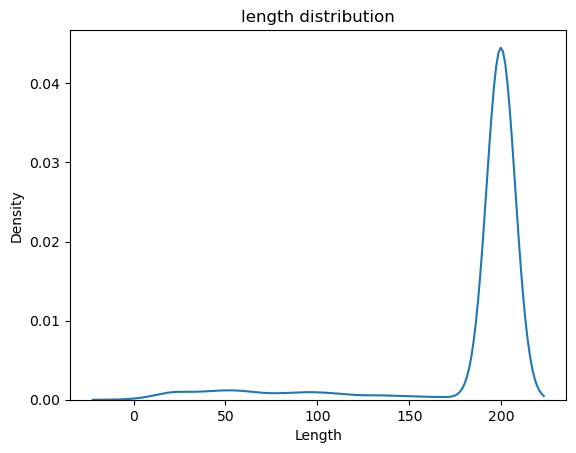

In [78]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure()
sns.kdeplot(x= df_fadmail['Length'],data = df_fadmail).set_title('length distribution')
plt.show()

In [79]:
df_fadmail_150 = df_fadmail[df_fadmail['Length'] >= 160]

In [80]:
df_fadmail_051 = df_fadmail[df_fadmail['Length'] < 160]

In [81]:
df_fadmail_150['Direction'].value_counts()

Direction
Outbound    2743
Inbound     2730
Name: count, dtype: int64

In [82]:
2743/2730

1.0047619047619047

In [83]:
df_fadmail_051['Direction'].value_counts()

Direction
Inbound     681
Outbound    109
Name: count, dtype: int64

In [84]:
681/109

6.247706422018348

In [85]:
df_fadmail_150['New Conversation'].value_counts()

New Conversation
0    3754
1    1719
Name: count, dtype: int64

In [86]:
df_fadmail_051['New Conversation'].value_counts()

New Conversation
1    669
0    121
Name: count, dtype: int64

In [87]:
stpwrd = nltk.corpus.stopwords.words('english')

stpwrd[:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [88]:
count_vectorizer = CountVectorizer(stop_words=stpwrd)

In [89]:
counts = count_vectorizer.fit_transform(corpus)

In [90]:
counts_df =  pd.DataFrame(counts.toarray(), columns = count_vectorizer.get_feature_names_out())
counts_df.head()

aa  aacc  ab  abacusroofingservices  abatchelor  abatement  abbas  abbi  \
0   0     0   0                      0           0          0      0     0   
1   0     0   0                      0           0          0      0     0   
2   0     0   0                      0           0          0      0     0   
3   0     0   0                      0           0          0      0     0   
4   0     0   0                      0           0          0      0     0   

   abbot  abby  abdullah  abe  aberdeen  abf  abfe  abigail  ability  able  \
0      0     0         0    0         0    0     0        0        0     0   
1      0     0         0    0         0    0     0        0        0     0   
2      0     0         0    0         0    0     0        0        0     0   
3      0     0         0    0         0    0     0        0        0     0   
4      0     0         0    0         0    0     0        0        0     0   

   abo  aboujvtuo  abovementioned  abr  abram  abroad  absence  absolute  \
0    0          0               0    0      0       0        0         0   
1    0          0               0    0      0       0        0         0   
2    0          0               0    0      0       0        0         0   
3    0          0               0    0      0       0        0         0   
4    0          0               0    0      0       0        0         0   

   absolutely  abubakir  abuse  abusing  ac  acc  accept  accepte  accepted  \
0           0         0      0        0   0    0       0        0         0   
1           0         0      0        0   0    0       0        0         0   
2           0         0      0        0   0    0       0        0         0   
3           0         0      0        0   0    0       0        0         0   
4           0         0      0        0   0    0       0        0         0   

   accepting  access  accessible  accessing  accessory  accident  \
0          0       0           0          0          0         0   
1          0       0           0          0          0         0   
2          0       0           0          0          0         0   
3          0       0           0          0          0         0   
4          0       0           0          0          0         0   

   accidentally  acco  accobramoz  acconot  accord  accordance  accordingl  \
0             0     0           0        0       0           0           0   
1             0     0           0        0       0           0           0   
2             0     0           0        0       0           0           0   
3             0     0           0        0       0           0           0   
4             0     0           0        0       0           0           0   

   accordingly  accou  accoun  account  accountspayable  accruing  accurate  \
0            0      0       0        0                0         0         0   
1            0      0       0        0                0         0         0   
2            0      0       0        0                0         0         0   
3            0      0       0        0                0         0         0   
4            0      0       0        0                0         0         0   

   achurch  acknowledge  acknowledged  acknowledgement  acknowledging  across  \
0        0            0             0                0              0       0   
1        0            0             0                0              0       0   
2        0            0             0                0              0       0   
3        0            0             0                0              0       0   
4        0            0             0                0              0       0   

   act  acti  action  actionfraud  activ  activa  activate  activated  \
0    0     0       0            0      0       0         0          0   
1    0     0       0            0      0       0         0          0   
2    0     0       0            0      0       0         0          0   
3

In [91]:
# counting terms
counts_dict = {}

# Store the words as key-value pairs
for ii, word in enumerate(counts_df.columns):
    counts_dict[word] = sum(counts_df[str(word)])
    word_count = [(i,count) for i,count in list(zip(counts_dict.keys(), counts_dict.values()))]

In [92]:
sorted_counts = sorted(word_count, key = lambda x: x[1], reverse = True)
sorted_counts[:40]

[('ad', 4559),
 ('hi', 3058),
 ('email', 3028),
 ('com', 2207),
 ('thank', 2174),
 ('please', 2103),
 ('know', 2092),
 ('message', 2033),
 ('friday', 1919),
 ('support', 1775),
 ('contacting', 1696),
 ('received', 1489),
 ('concern', 1222),
 ('googlemail', 1132),
 ('letting', 1122),
 ('account', 1120),
 ('delivery', 1119),
 ('mta', 1118),
 ('dns', 1117),
 ('name', 1112),
 ('let', 1012),
 ('new', 978),
 ('uk', 974),
 ('co', 954),
 ('hope', 953),
 ('id', 952),
 ('well', 930),
 ('hello', 836),
 ('thanks', 833),
 ('detail', 807),
 ('fake', 801),
 ('sent', 765),
 ('advert', 737),
 ('attached', 654),
 ('verification', 613),
 ('believe', 593),
 ('fine', 593),
 ('notification', 568),
 ('report', 568),
 ('status', 567)]

In [93]:
corpus_temp = []

text = list(df_fadmail[df_fadmail['Length']<160].Extract)

for i in range(len(text)):
    r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
    r = r.lower()
    r = r.split()
#     r = [word for word in r if word not in stopwords.words('english')]
#     r = [lemmatizer.lemmatize(word) for word in r]
    r = ' '.join(r)
    corpus_temp.append(r)

In [94]:
corpus_temp

['hi i ve been asked to email you regarding my advert it needs verification regards natalie wiles',
 'hi i m messaging about my ad',
 'i have received a message to say i need to verify my email sent from outlook for ios',
 'i recieved an email from you requesting me to contact you regarding verification yours caroline kulak',
 'to syed here s a better picture showing the amount e thank you sent from yahoo mail on android',
 'hi i am telling you i am verified my add with you sent from my ipad kind regards sheila spence',
 'hi can i tell me please what i have to do thank u',
 'hi please can you verify my advert kind regards sabina wys ane z apka do gmaila',
 'verication needed',
 'hi i ve been told i need to verify my ad for some reason kind regards leanne sent from my iphone',
 'hi i ve been told to email to verify my email address',
 'dear horsemart please use this email as verification many thanks michaela russell sent from my iphone',
 'sent from yahoo mail on android',
 'hi there i 

In [95]:
df_fadmail_inbound = df_fadmail[df_fadmail['Direction']=='Inbound']

In [96]:
corpus = []

text = list(df_fadmail_inbound['Extract'])

for i in range(len(text)):
    r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
    r = r.lower()
    r = r.split()
    r = [word for word in r if word not in stopwords.words('english')]
    r = [lemmatizer.lemmatize(word) for word in r]
    r = ' '.join(r)
    corpus.append(r)

In [97]:
corpus

['permitted post nude photo private bit visible advertiser profile sun jan fmg support friday ad co uk wrote hi thanks contacting u sorry',
 'notified rule sn spidersnet conversation ebay feed fault strafford car fraser strafford co uk inbox spidersnet fraser strafford co uk ebay feed fault',
 'please someone let know advert updated gone live add tagged ref num respond regular email thankyou faith edmonds craig',
 'asked reminded ad ref ht pre friend sale inbox callback pre friend sale ad ref ht postal code thu dec suppor',
 'notified rule sn spidersnet conversation ebay feed fault strafford car fraser strafford co uk inbox spidersnet fraser strafford co uk ebay feed fault',
 'notified rule sn spidersnet conversation ebay feed fault strafford car spidersnet co uk inbox spidersnet spidersnet co uk ebay feed fa',
 'notified rule sn spidersnet conversation ebay feed fault strafford car spidersnet co uk inbox spidersnet spidersnet co uk ebay feed fa',
 'hi asked email regarding advert need

In [98]:
count_vectorizer = CountVectorizer(stop_words=stpwrd)

In [99]:
counts = count_vectorizer.fit_transform(corpus)

In [100]:
counts_df =  pd.DataFrame(counts.toarray(), columns = count_vectorizer.get_feature_names_out())
counts_df.head()

aa  aacc  ab  abacusroofingservices  abatchelor  abatement  abbi  abbot  \
0   0     0   0                      0           0          0     0      0   
1   0     0   0                      0           0          0     0      0   
2   0     0   0                      0           0          0     0      0   
3   0     0   0                      0           0          0     0      0   
4   0     0   0                      0           0          0     0      0   

   abdullah  abe  aberdeen  abf  abfe  abigail  able  abo  aboujvtuo  abr  \
0         0    0         0    0     0        0     0    0          0    0   
1         0    0         0    0     0        0     0    0          0    0   
2         0    0         0    0     0        0     0    0          0    0   
3         0    0         0    0     0        0     0    0          0    0   
4         0    0         0    0     0        0     0    0          0    0   

   abram  abroad  absence  absolute  absolutely  abubakir  abuse  abusing  ac  \
0      0       0        0         0           0         0      0        0   0   
1      0       0        0         0           0         0      0        0   0   
2      0       0        0         0           0         0      0        0   0   
3      0       0        0         0           0         0      0        0   0   
4      0       0        0         0           0         0      0        0   0   

   acc  accept  accepted  accepting  access  accessing  accident  \
0    0       0         0          0       0          0         0   
1    0       0         0          0       0          0         0   
2    0       0         0          0       0          0         0   
3    0       0         0          0       0          0         0   
4    0       0         0          0       0          0         0   

   accidentally  acco  acconot  accord  accoun  account  accountspayable  \
0             0     0        0       0       0        0                0   
1             0     0        0       0       0        0                0   
2             0     0        0       0       0        0                0   
3             0     0        0       0       0        0                0   
4             0     0        0       0       0        0                0   

   accruing  acknowledge  acknowledged  acknowledgement  acknowledging  \
0         0            0             0                0              0   
1         0            0             0                0              0   
2         0            0             0                0              0   
3         0            0             0                0              0   
4         0            0             0                0              0   

   across  action  activ  activate  activated  activation  active  activity  \
0       0       0      0         0          0           0       0         0   
1       0       0      0         0          0           0       0         0   
2       0       0      0         0          0           0       0         0   
3       0       0      0         0          0           0       0         0   
4       0       0      0         0          0           0       0         0   

   acton  actor  actual  actually  acura  ad  adam  add  added  adding  \
0      0      0       0         0      0   1     0    0      0       0   
1      0      0       0         0      0   0     0    0      0       0   
2      0      0       0         0      0   0     0    1      0       0   
3      0      0       0         0      0   2     0    0      0       0   
4      0      0       0         0      0   0     0    0      0       0   

   additional  additionally  addr  address  addressed  adelina  adid  \
0           0             0     0        0          0        0     0   
1           0             0     0        0          0        0     0   
2           0             0     0        0          0        0     0   
3           0             0     0        0          0        0   

In [101]:
# counting terms
counts_dict = {}

# Store the words as key-value pairs
for ii, word in enumerate(counts_df.columns):
    counts_dict[word] = sum(counts_df[str(word)])
    word_count = [(i,count) for i,count in list(zip(counts_dict.keys(), counts_dict.values()))]

In [102]:
sorted_counts = sorted(word_count, key = lambda x: x[1], reverse = True)
sorted_counts[:40]

[('ad', 3023),
 ('com', 2108),
 ('email', 1993),
 ('message', 1968),
 ('support', 1550),
 ('received', 1475),
 ('friday', 1338),
 ('googlemail', 1130),
 ('delivery', 1119),
 ('mta', 1118),
 ('dns', 1117),
 ('new', 930),
 ('name', 916),
 ('uk', 878),
 ('id', 876),
 ('co', 870),
 ('please', 837),
 ('hi', 835),
 ('sent', 734),
 ('attached', 649),
 ('report', 568),
 ('notification', 565),
 ('enclosed', 561),
 ('reporting', 561),
 ('status', 561),
 ('daemon', 558),
 ('mailer', 558),
 ('advert', 520),
 ('hello', 427),
 ('wrote', 404),
 ('gmail', 401),
 ('thanks', 378),
 ('thank', 369),
 ('log', 357),
 ('verify', 314),
 ('visit', 297),
 ('account', 270),
 ('mail', 255),
 ('iphone', 253),
 ('ff', 230)]

In [103]:
df_fadmail['Message ID'].nunique()

6337

In [104]:
df_fadmail['Conversation ID'].nunique()

2891

In [105]:
6337/2891

2.1919750951227948

In [106]:
df_fadmail_inbound['Message ID'].nunique()

3470

In [107]:
df_fadmail_inbound['Conversation ID'].nunique()

2260

In [108]:
3470/2260

1.5353982300884956

In [109]:
df_fadmail['Length'].value_counts()

Length
200.0    5065
198.0     131
199.0      63
197.0      56
196.0      40
         ... 
140.0       1
8.0         1
162.0       1
119.0       1
13.0        1
Name: count, Length: 189, dtype: int64

In [110]:
df_temp = df_fadmail[df_fadmail['Length']==200]

In [111]:
list(df_temp['Extract'])

["Hi, thanks for contacting us, sorry but we are now out of the office, however, if you leave us your name, advert reference, & email address with a brief description of how we can help we'll get back i",
 'Is it permitted to post a nude photo (no private bits visible) on an advertisers profile? On Sun, 1 Jan 2023, 01:47 FMG, <support@friday-ad.co.uk> wrote: Hi, thanks for contacting us, sorry but we are',
 'You were notified by rule SN - Spidersnet 999 about conversation Re: Ebay feed fault - Strafford Cars. with fraser@strafford.co.uk Inbox: Spidersnet - 999 fraser@strafford.co.uk - Re: Ebay feed fault ',
 'You asked to be reminded about Re: ad ref. HT2529041 with Pre Friends SALE Inbox: Callbacks Pre Friends SALE - Re: ad ref. HT2529041 +34658272479 Postal code 29680 On Thu, 29 Dec 2022 at 12:48, Suppor',
 'You were notified by rule SN - Spidersnet 999 about conversation Re: Ebay feed fault - Strafford Cars. with fraser@strafford.co.uk Inbox: Spidersnet - 999 fraser@strafford.co.uk 

In [112]:
df_fadmail_outbound = df_fadmail[df_fadmail['Direction']=='Outbound']

In [113]:
corpus = []

text = list(df_fadmail_outbound['Extract'])

for i in range(len(text)):
    r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
    r = r.lower()
    r = r.split()
    r = [word for word in r if word not in stopwords.words('english')]
    r = [lemmatizer.lemmatize(word) for word in r]
    r = ' '.join(r)
    corpus.append(r)

In [114]:
corpus

['hi thanks contacting u sorry office however leave u name advert reference email address brief description help get back',
 'hi thanks contacting u sorry office however leave u name advert reference email address brief description help get back',
 'hi thanks contacting u sorry office however leave u name advert reference email address brief description help get back',
 'hello thank message welcome live help name syed advert reviewed moderation system ensure listed correct category co',
 'hi thanks contacting u sorry office however leave u name advert reference email address brief description help get back',
 'hi thanks contacting u sorry office however leave u name advert reference email address brief description help get back',
 'hello thank message welcome live help name syed please share ad ref pull detail support fmg sunday jan bgroom',
 'hello thank message welcome live help name syed please share ad ref pull detail hi noticed responded sti',
 'hello rajesh hope well email accoun

# <div class = 'alert alert-info'> Activity Dataset </div>

---

In [115]:
data = pd.read_csv('/Users/rajathadri_as/Documents/export-activities-fmg-2023-12-13-346d-3b40f1.csv')

In [116]:
data.head()

,Activity ID,Type,Source,Message ID,Conversation ID,Segment,Segment start,Segment end,Direction,Status,Status at activity time,Inbox,Inbox API ID,Inbox at activity time,Inbox API IDs at activity time,Previous inbox IDs,Message date,Autoreply,Reaction time,Total reply time,Handle time,Response time,Attributed to,Assignee,Author,Contact name,Contact handle,Account names,To,Cc,Bcc,Extract,Tags,Tag API IDs,Tags at activity time,Tag API IDs at activity time,Tag application duration,Activity API ID,Message API ID,Comment API ID,Conversation API ID,Message original ID,New Conversation,First response,Business hours,Subject,Account name,Survey rating,Survey comment,Segment closed,Segment contains messages,Last segment activity
0,113458077188,inbound,smtp,3.481319e+10,22159694404,1,2023-01-01 06:30:18,NaN,Inbound,Open,Open,Email - Horseclicks,inb_lt42,Email - Horseclicks,inb_lt42,NaN,2023-01-01 06:30:18,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,K B,kabloom@penn.com,NaN,info@horseclicks.com,NaN,NaN,I apologize for this automatic reply to your e...,Horseclicks,tag_3dfgy,Horseclicks,tag_3dfgy,NaN,evt_1g4e0cn8,msg_fzqvj5w,NaN,cnv_a6hb5ms,63b0e228.810a0220.8b722.184aSMTPIN_ADDED_MISSI...,1,0,0,Re: Ad alert - it's a match!,NaN,NaN,NaN,NaN,1,NaN
1,113458077188,inbound,smtp,3.481319e+10,22159694404,1,2023-01-01 06:30:18,NaN,Inbound,Open,Open,Email - Internet Support,inb_lt16,Email - Horseclicks,inb_lt42,NaN,2023-01-01 06:30:18,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,K B,kabloom@penn.com,NaN,info@horseclicks.com,NaN,NaN,I apologize for this automatic reply to your e...,Horseclicks,tag_3dfgy,Horseclicks,tag_3dfgy,NaN,evt_1g4e0cn8,msg_fzqvj5w,NaN,cnv_a6hb5ms,63b0e228.810a0220.8b722.184aSMTPIN_ADDED_MISSI...,1,0,0,Re: Ad alert - it's a match!,NaN,NaN,NaN,NaN,1,NaN
2,113458077380,restore,gmail,NaN,22159694404,1,2023-01-01 06:30:18,NaN,NaN,Open,Open,Email - Horseclicks,inb_lt42,"Email - Horseclicks,Email - Internet Support","inb_lt42,inb_lt16",NaN,2023-01-01 06:30:24,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,K B,kabloom@penn.com,NaN,NaN,NaN,NaN,NaN,Horseclicks,tag_3dfgy,Horseclicks,tag_3dfgy,NaN,evt_1g4e0csk,NaN,NaN,cnv_a6hb5ms,NaN,0,0,0,NaN,NaN,NaN,NaN,NaN,1,NaN
3,113458077380,restore,gmail,NaN,22159694404,1,2023-01-01 06:30:18,NaN,NaN,Open,Open,Email - Internet Support,inb_lt16,"Email - Horseclicks,Email - Internet Support","inb_lt42,inb_lt16",NaN,2023-01-01 06:30:24,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,K B,kabloom@penn.com,NaN,NaN,NaN,NaN,NaN,Horseclicks,tag_3dfgy,Horseclicks,tag_3dfgy,NaN,evt_1g4e0csk,NaN,NaN,cnv_a6hb5ms,NaN,0,0,0,NaN,NaN,NaN,NaN,NaN,1,NaN
4,113458146948,inbound,front_chat,3.481322e+10,22159708932,1,2023-01-01 06:41:41,NaN,Inbound,Archived,Open,Live Chat - FAD,inb_4lre,Live Chat - FAD,inb_4lre,NaN,2023-01-01 06:41:41,0,NaN,NaN,NaN,NaN,support,NaN,NaN,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,NaN,446d1708-f53c-11e7-934b-832da75fc149,NaN,NaN,Hi. How long does it usually take for an ad to...,"FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",NaN,NaN,NaN,evt_1g4e1uh0,msg_fzqw138,NaN,cnv_a6hbguc,e10fd005-af9c-462e-a54b-8cb1cedd59b5,1,0,0,NaN,NaN,NaN,NaN,NaN,1,NaN


In [117]:
data.shape

(132373, 52)

In [118]:
list(data['Extract'])

['I apologize for this automatic reply to your email. To control spam, I now allow incoming messages only from senders I have approved beforehand. If you would like to be added to my list of approved se',
 'I apologize for this automatic reply to your email. To control spam, I now allow incoming messages only from senders I have approved beforehand. If you would like to be added to my list of approved se',
 nan,
 nan,
 'Hi. How long does it usually take for an ad to be reviewed?',
 nan,
 "Hi, thanks for contacting us, sorry but we are now out of the office, however, if you leave us your name, advert reference, & email address with a brief description of how we can help we'll get back i",
 'User submitted their email: lensijex067@gmail.com',
 "Hi, thanks for contacting us, sorry but we are now out of the office, however, if you leave us your name, advert reference, & email address with a brief description of how we can help we'll get back i",
 "Hi, thanks for contacting us, sorry but we

In [119]:
data.isnull().sum()

Activity ID                            0
Type                                   0
Source                                 0
Message ID                         56798
Conversation ID                        0
Segment                                0
Segment start                          0
Segment end                         5513
Direction                          67649
Status                                 0
Status at activity time                0
Inbox                                  0
Inbox API ID                           0
Inbox at activity time                 0
Inbox API IDs at activity time         0
Previous inbox IDs                129567
Message date                           0
Autoreply                              0
Reaction time                     121229
Total reply time                  124970
Handle time                       101060
Response time                     121224
Attributed to                      13252
Assignee                          132321
Author          

In [120]:
data.drop(['Assignee','Account names','Cc','Bcc','Tag application duration','Activity API ID','Message API ID','Comment API ID','Conversation API ID','Account name','Survey rating','Survey comment'], axis=1, inplace =True)

In [121]:
data['Message date'] = pd.to_datetime(data['Message date'])

In [122]:
df_activity_fadlive = data[data['Inbox']=='Live Chat - FAD']

In [123]:
df_activity_fadlive.shape

(31864, 40)

In [124]:
df_activity_fadlive.info()

<class 'pandas.core.frame.DataFrame'>
Index: 31864 entries, 4 to 132372
Data columns (total 40 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   Activity ID                     31864 non-null  int64         
 1   Type                            31864 non-null  object        
 2   Source                          31864 non-null  object        
 3   Message ID                      24781 non-null  float64       
 4   Conversation ID                 31864 non-null  int64         
 5   Segment                         31864 non-null  int64         
 6   Segment start                   31864 non-null  object        
 7   Segment end                     30347 non-null  object        
 8   Direction                       23839 non-null  object        
 9   Status                          31864 non-null  object        
 10  Status at activity time         31864 non-null  object        
 11  Inbox 

In [125]:
in_activity_fadlive = df_activity_fadlive[df_activity_fadlive['Direction']=='Inbound']

In [126]:
in_activity_fadlive.shape

(9160, 40)

In [127]:
corpus = []

text = list(in_activity_fadlive['Extract'])

for i in range(len(text)):
    r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
    r = r.lower()
    r = r.split()
    r = [word for word in r if word not in stopwords.words('english')]
    r = [lemmatizer.lemmatize(word) for word in r]
    r = ' '.join(r)
    corpus.append(r)

In [128]:
count_vectorizer = CountVectorizer(stop_words=stpwrd)

In [129]:
counts = count_vectorizer.fit_transform(corpus)

In [130]:
counts_df =  pd.DataFrame(counts.toarray(), columns = count_vectorizer.get_feature_names_out())
counts_df.head()

aa  aalexarebeca  ab  abarnard  abdul  aberdeen  ability  able  absolutely  \
0   0             0   0         0      0         0        0     0           0   
1   0             0   0         0      0         0        0     0           0   
2   0             0   0         0      0         0        0     0           0   
3   0             0   0         0      0         0        0     0           0   
4   0             0   0         0      0         0        0     0           0   

   ac  acc  accept  accepted  accepting  acces  access  accidentally  \
0   0    0       0         0          0      0       0             0   
1   0    0       0         0          0      0       0             0   
2   0    0       0         0          0      0       0             0   
3   0    0       0         0          0      0       0             0   
4   0    0       0         0          0      0       0             0   

   accidentlally  acconts  accou  account  accountant  accout  acctualy  \
0              0        0      0        0           0       0         0   
1              0        0      0        0           0       0         0   
2              0        0      0        0           0       0         0   
3              0        0      0        0           0       0         0   
4              0        0      0        0           0       0         0   

   aceasi  acest  across  action  activate  activated  activation  active  \
0       0      0       0       0         0          0           0       0   
1       0      0       0       0         0          0           0       0   
2       0      0       0       0         0          0           0       0   
3       0      0       0       0         0          0           0       0   
4       0      0       0       0         0          0           0       0   

   actual  actually  acvount  ad  adam  adamcharlesjohns  add  added  addf  \
0       0         0        0   1     0                 0    0      0     0   
1       0         0        0   0     0                 0    0      0     0   
2       0         0        0   0     0                 0    0      0     0   
3       0         0        0   0     0                 0    0      0     0   
4       0         0        0   0     0                 0    0      0     0   

   adding  additional  addlestone  addm  address  adeagbemuko  adelaalima  \
0       0           0           0     0        0            0           0   
1       0           0           0     0        0            0           0   
2       0           0           0     0        0            0           0   
3       0           0           0     0        0            0           0   
4       0           0           0     0        0            0           0   

   adf  adjustable  admission  admit  admits  adresa  adrese  adress  adrwert  \
0    0           0          0      0       0       0       0       0        0   
1    0           0          0      0       0       0       0       0        0   
2    0           0          0      0       0       0       0       0        0   
3    0           0          0      0       0       0       0       0        0   
4    0           0          0      0       0       0       0       0        0   

   adsnow  adult  adultseek  adv  advance  adver  adverise  advert  advertise  \
0       0      0          0    0        0      0         0       0          0   
1       0      0          0    0        0      0         0       0          0   
2       0      0          0    0        0      0         0       0          0   
3       0      0          0    0        0      0         0       0          0   
4       0      0          0    0        0      0         0       0          0   

   advertised  advertisement  advertiser  advertising  advertisment  advice  \
0           0              0           0            0             0       0   
1           0              0           0            0             0       0   
2           0             

In [131]:
# counting terms
counts_dict = {}

# Store the words as key-value pairs
for ii, word in enumerate(counts_df.columns):
    counts_dict[word] = sum(counts_df[str(word)])
    word_count = [(i,count) for i,count in list(zip(counts_dict.keys(), counts_dict.values()))]

In [132]:
sorted_counts = sorted(word_count, key = lambda x: x[1], reverse = True)
sorted_counts[:40]

[('ad', 1263),
 ('com', 971),
 ('hi', 665),
 ('please', 644),
 ('thank', 605),
 ('gmail', 597),
 ('ok', 562),
 ('hello', 546),
 ('thanks', 486),
 ('ff', 463),
 ('email', 425),
 ('advert', 383),
 ('want', 318),
 ('change', 288),
 ('help', 288),
 ('add', 285),
 ('yes', 283),
 ('live', 261),
 ('one', 229),
 ('put', 223),
 ('need', 215),
 ('day', 192),
 ('paid', 189),
 ('ref', 185),
 ('nan', 182),
 ('number', 182),
 ('time', 178),
 ('account', 175),
 ('photo', 171),
 ('renew', 168),
 ('still', 168),
 ('like', 166),
 ('see', 164),
 ('user', 162),
 ('submitted', 157),
 ('good', 156),
 ('pay', 151),
 ('place', 146),
 ('know', 144),
 ('location', 142)]

In [133]:
df_activity_fadlive.info()

<class 'pandas.core.frame.DataFrame'>
Index: 31864 entries, 4 to 132372
Data columns (total 40 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   Activity ID                     31864 non-null  int64         
 1   Type                            31864 non-null  object        
 2   Source                          31864 non-null  object        
 3   Message ID                      24781 non-null  float64       
 4   Conversation ID                 31864 non-null  int64         
 5   Segment                         31864 non-null  int64         
 6   Segment start                   31864 non-null  object        
 7   Segment end                     30347 non-null  object        
 8   Direction                       23839 non-null  object        
 9   Status                          31864 non-null  object        
 10  Status at activity time         31864 non-null  object        
 11  Inbox 

In [134]:
df_activity_fadlive.head()

,Activity ID,Type,Source,Message ID,Conversation ID,Segment,Segment start,Segment end,Direction,Status,Status at activity time,Inbox,Inbox API ID,Inbox at activity time,Inbox API IDs at activity time,Previous inbox IDs,Message date,Autoreply,Reaction time,Total reply time,Handle time,Response time,Attributed to,Author,Contact name,Contact handle,To,Extract,Tags,Tag API IDs,Tags at activity time,Tag API IDs at activity time,Message original ID,New Conversation,First response,Business hours,Subject,Segment closed,Segment contains messages,Last segment activity
4,113458146948,inbound,front_chat,3.481322e+10,22159708932,1,2023-01-01 06:41:41,NaN,Inbound,Archived,Open,Live Chat - FAD,inb_4lre,Live Chat - FAD,inb_4lre,NaN,2023-01-01 06:41:41,0,NaN,NaN,NaN,NaN,support,NaN,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,446d1708-f53c-11e7-934b-832da75fc149,Hi. How long does it usually take for an ad to...,"FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",NaN,NaN,e10fd005-af9c-462e-a54b-8cb1cedd59b5,1,0,0,NaN,NaN,1,NaN
5,113458147140,tag,rule,NaN,22159708932,1,2023-01-01 06:41:41,NaN,NaN,Archived,Open,Live Chat - FAD,inb_4lre,Live Chat - FAD,inb_4lre,NaN,2023-01-01 06:41:42,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,NaN,NaN,"FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",FAD,tag_1sbs2,NaN,0,0,0,NaN,NaN,1,NaN
6,113458147268,out_reply,rule,3.481322e+10,22159708932,1,2023-01-01 06:41:41,NaN,Outbound,Archived,Open,Live Chat - FAD,inb_4lre,Live Chat - FAD,inb_4lre,NaN,2023-01-01 06:41:42,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,a0a6f72b-f358-4799-bc80-8cae83f9c123,"Hi, thanks for contacting us, sorry but we are...","FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",FAD,tag_1sbs2,2e58cf7f-9258-46f4-ae26-bf6e14ee8153,0,0,0,NaN,NaN,1,NaN
7,113458149828,inbound,front_chat,3.481322e+10,22159708932,1,2023-01-01 06:41:41,NaN,Inbound,Archived,Open,Live Chat - FAD,inb_4lre,Live Chat - FAD,inb_4lre,NaN,2023-01-01 06:42:03,0,NaN,NaN,NaN,NaN,support,NaN,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,446d1708-f53c-11e7-934b-832da75fc149,User submitted their email: lensijex067@gmail.com,"FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",FAD,tag_1sbs2,e40f1fd8-bcbc-499a-b2d1-c8e38dc31e1c,0,0,0,NaN,NaN,1,NaN
8,113458149892,out_reply,rule,3.481322e+10,22159708932,1,2023-01-01 06:41:41,NaN,Outbound,Archived,Open,Live Chat - FAD,inb_4lre,Live Chat - FAD,inb_4lre,NaN,2023-01-01 06:42:04,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,a0a6f72b-f358-4799-bc80-8cae83f9c123,a0a6f72b-f358-4799-bc80-8cae83f9c123,"Hi, thanks for contacting us, sorry but we are...","FAD,Syed Muhammad,Why is my ad not live","tag_1sbs2,tag_i5kxw,tag_415ok",FAD,tag_1sbs2,899abe7c-d49b-466d-a7a4-62998745b338,0,0,0,NaN,NaN,1,NaN


In [135]:
df_activity_fadlive['Type'].value_counts()

Type
out_reply    14642
inbound       9160
tag           5148
archive       2360
reopen         272
untag          142
comment         51
outbound        37
trash           23
restore         21
snooze           5
reminder         3
Name: count, dtype: int64

In [136]:
df_activity_fadlive['Direction'].value_counts()

Direction
Outbound    14679
Inbound      9160
Name: count, dtype: int64

In [137]:
14679-14642

37

# <div class = 'alert alert-success'>Callbacks</div>

In [138]:
df_callbacks = df[df['Inbox']=='Callbacks']

In [139]:
df_callbacks.head(3)

,Message ID,Conversation ID,Segment,Direction,Status,Inbox,Inbox API ID,Message date,Autoreply,Attributed to,Contact name,Contact handle,To,Extract,Tags,Tag API IDs,Message API ID,Conversation API ID,New Conversation,First response,Business hours,Subject,Segment start,Segment end,Segment closed,Last segment activity
123,34829709572,22168932420,1,Inbound,Archived,Callbacks,inb_wxqc,2023-01-02 17:12:50,0,support,NaN,karingrutz44@gmail.com,support@horseclicks.com,"To whom it may concern, As requested to author...","Horseclicks,Ashfaq Ahmad,Verification","tag_3dfgy,tag_ifudg,tag_g4emc",msg_g00pjwk,cnv_a6mt5qc,1,0,0,Request for ad,2023-01-02 17:12:50,NaN,NaN,NaN
248,34836079684,22172803652,1,Inbound,Archived,Callbacks,inb_wxqc,2023-01-03 08:18:29,0,support,annettebrierley66@gmail.com,annettebrierley66@gmail.com,support@friday-ad.co.uk,They seems to be a problem with you posting my...,"Ashfaq Ahmad,Verification","tag_ifudg,tag_g4emc",msg_g04i344,cnv_a6p44sk,1,0,0,Re:,2023-01-03 08:18:29,NaN,NaN,NaN
287,34837556932,22173668676,1,Inbound,Archived,Callbacks,inb_wxqc,2023-01-03 09:24:12,0,support,Scott,scottpullers03@gmail.com,support@friday-ad.co.uk,Hi I'm trying to put my puppies up for sale bu...,"Ashfaq Ahmad,Verification,Asad Butt","tag_ifudg,tag_g4emc,tag_i5kqs",msg_g05dqys,cnv_a6pmo90,1,0,1,Re:,2023-01-03 09:24:12,NaN,NaN,NaN


In [140]:
df_callbacks['To'].value_counts()

To
support@friday-ad.co.uk                 3376
446d1708-f53c-11e7-934b-832da75fc149     264
support@birdtrader.co.uk                 178
support@horseclicks.com                  173
support@kittenads.co.uk                  132
                                        ... 
louisabent332@outlook.com                  1
aishakhan231@hotmail.com                   1
lena_beregovay@yahoo.co.uk                 1
elliesealpreston89@gmail.com               1
a.k.malewska@gmail.com                     1
Name: count, Length: 1768, dtype: int64

## WTF is Callbacks?

Seems like a mix of multiple site queries.

Assumption : This is probably a category created by support team to remind themselves to follow-up?

# <div class = 'alert alert-success'>Gunstar</div>

In [141]:
df['Inbox'].value_counts()

Inbox
Live Chat - FAD             23690
Callbacks                    7171
Email - FAD                  6337
Live Chat - Wightbay         6110
Email - Internet Support     3030
Email - Gunstar              2793
Live Chat - Caravans         2738
Live Chat - Gunstar          2386
Live Chat - Horsemart        2268
Email - Horseclicks          2094
Email - Caravans             1668
Email - Horsemart            1497
Live Chat - Horseclicks       617
Email - Wightbay              612
Email - UpCountry             552
Email - Birdtrader            510
Email - Dogs & Puppies        241
Email - Kitten Ads            175
Spidersnet - 999               24
Spidersnet Support             19
Email - BS24Support             1
Name: count, dtype: int64

In [142]:
df_gsmail = df[df['Inbox']=='Email - Gunstar']

In [143]:
df_gsmail.shape

(2793, 26)

In [144]:
df_gslive = df[df['Inbox']=='Live Chat - Gunstar']

In [145]:
df_gslive.shape

(2386, 26)

# Gunstar - Live

In [146]:
df_gsmail.head(2)

,Message ID,Conversation ID,Segment,Direction,Status,Inbox,Inbox API ID,Message date,Autoreply,Attributed to,Contact name,Contact handle,To,Extract,Tags,Tag API IDs,Message API ID,Conversation API ID,New Conversation,First response,Business hours,Subject,Segment start,Segment end,Segment closed,Last segment activity
35,34817482692,22162148996,1,Inbound,Archived,Email - Gunstar,inb_lsqy,2023-01-01 19:43:39,0,support,gunstar.co.uk,no-reply@gunstar.co.uk,"support@gunstar.co.uk,kate.kidger@fridaymediag...",You have received a new message. Name: Dave Th...,"GUNSTAR,Other,Syed Muhammad","tag_2x9mq,tag_41610,tag_i5kxw",msg_fztfhl0,cnv_a6irrlw,1,0,0,New contact Dave Thompson,2023-01-01 19:43:39,NaN,NaN,NaN
36,34817498116,22162156804,1,Inbound,Archived,Email - Gunstar,inb_lsqy,2023-01-01 19:46:32,0,support,gunstar.co.uk,no-reply@gunstar.co.uk,"support@gunstar.co.uk,kate.kidger@fridaymediag...",You have received a new message. Name: Dave Th...,"GUNSTAR,Why is my ad not live,Syed Muhammad","tag_2x9mq,tag_415ok,tag_i5kxw",msg_fztfthg,cnv_a6irxms,1,0,0,Re: New contact Dave Thompson,2023-01-01 19:46:32,NaN,NaN,NaN


In [147]:
df_gschats = df_gslive[['Message ID','Extract']]

In [148]:
df_gschats.head()

,Message ID,Extract
54,34818626948,how to post free add
55,34818627076,"Hi, thanks for contacting us, sorry but we are..."
268,34837213892,"Hello, welcome to live help. My name is Umar."
305,34838039684,"Hi, I've noticed you haven't responded for a w..."
501,34849638660,hi


In [149]:
# Lemmatize
lemmatizer = WordNetLemmatizer()

In [150]:
corpus = []

text = list(df_gslive['Extract'])

for i in range(len(text)):
    r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
    r = r.lower()
    r = r.split()
    r = [word for word in r if word not in stopwords.words('english')]
    r = [lemmatizer.lemmatize(word) for word in r]
    r = ' '.join(r)
    corpus.append(r)

In [151]:
corpus

['post free add',
 'hi thanks contacting u sorry office however leave u name advert reference email address brief description help get back',
 'hello welcome live help name umar',
 'hi noticed responded still need assistance please message glad help',
 'hi',
 'hi welcome live help name ash may help',
 'paid ad got time message',
 'may please email address ad reference number pull detail',
 'klimt gmail com',
 'thanks detail reviewed please bear',
 'g',
 'ok thanks',
 'thank holding',
 'please share paypal receipt',
 'please share payment receipt forward payment team investigate',
 'screenshot',
 'sure screenshots image pdf file payment receipt',
 'nan',
 'thank receipt forwarded payment team investigate resolve concern within hour',
 'anything else help',
 'thanx',
 'thank using service pleasure talk please feel free approach u back need sort help wonderful day goodbye',
 'make avert live please im getting stressed http www gunstar co uk webley webley scott venom sidewinder air rifle a

In [152]:
from collections import Counter  
  
# counts word frequency 
def count_words(text):                   
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = {}  
    for word in text.split(" "):  
        if word in word_counts:  
            word_counts[word]+= 1 
        else:  
            word_counts[word]= 1 
    return word_counts

In [153]:
def count_words_fast(text):      
    text = text.lower()  
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = Counter(text.split(" "))  
    return word_counts  

In [154]:
count_words(corpus[0])

{'post': 1, 'free': 1, 'add': 1}

In [155]:
df_gslive['Length'] = df_gslive['Extract'].str.len()

In [156]:
df_gslive.head(2)

,Message ID,Conversation ID,Segment,Direction,Status,Inbox,Inbox API ID,Message date,Autoreply,Attributed to,Contact name,Contact handle,To,Extract,Tags,Tag API IDs,Message API ID,Conversation API ID,New Conversation,First response,Business hours,Subject,Segment start,Segment end,Segment closed,Last segment activity,Length
54,34818626948,22162745284,1,Inbound,Archived,Live Chat - Gunstar,inb_5ua2,2023-01-02 00:44:12,0,internet,NaN,boulter94@outlook.com,e6e02bd0-0043-11e8-8aaf-afdc89d928e2,how to post free add,"GUNSTAR,Umer Butt,Other","tag_2x9mq,tag_i5kzo,tag_41610",msg_fzu40hw,cnv_a6j4jpg,1,0,0,NaN,2023-01-02 00:44:12,NaN,NaN,NaN,20.0
55,34818627076,22162745284,1,Outbound,Archived,Live Chat - Gunstar,inb_5ua2,2023-01-02 00:44:13,1,NaN,NaN,boulter94@outlook.com,boulter94@outlook.com,"Hi, thanks for contacting us, sorry but we are...","GUNSTAR,Umer Butt,Other","tag_2x9mq,tag_i5kzo,tag_41610",msg_fzu40lg,cnv_a6j4jpg,0,0,0,NaN,2023-01-02 00:44:12,NaN,NaN,NaN,200.0


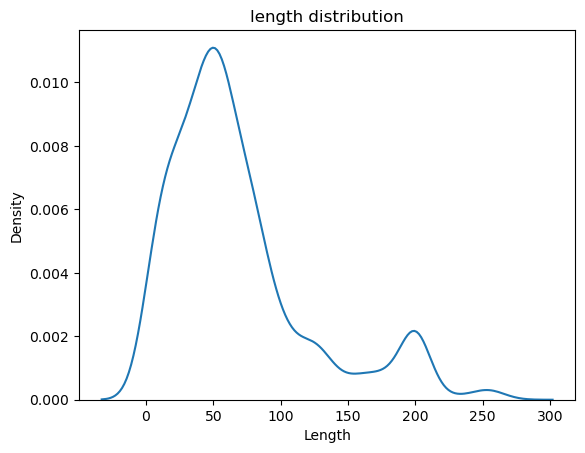

In [157]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure()
sns.kdeplot(x= df_gslive['Length'],data = df_gslive).set_title('length distribution')
plt.show()

In [158]:
df_gslive_150 = df_gslive[df_gslive['Length'] >= 150]

In [159]:
df_gslive_051 = df_gslive[df_gslive['Length'] < 150]

In [160]:
df_gslive_150['Direction'].value_counts()

Direction
Outbound    176
Inbound      67
Name: count, dtype: int64

In [161]:
176/67

2.626865671641791

In [162]:
df_gslive_051['Direction'].value_counts()

Direction
Outbound    1390
Inbound      725
Name: count, dtype: int64

In [163]:
1390/725

1.9172413793103449

In [164]:
df_gslive_150['New Conversation'].value_counts()

New Conversation
0    216
1     27
Name: count, dtype: int64

In [165]:
df_gslive_051['New Conversation'].value_counts()

New Conversation
0    1986
1     129
Name: count, dtype: int64

In [166]:
df_gslive['Direction'].value_counts()

Direction
Outbound    1579
Inbound      807
Name: count, dtype: int64

In [167]:
df_gsmail['Direction'].value_counts()

Direction
Inbound     1422
Outbound    1371
Name: count, dtype: int64

In [168]:
stpwrd = nltk.corpus.stopwords.words('english')

stpwrd[:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [169]:
count_vectorizer = CountVectorizer(stop_words=stpwrd)

In [170]:
counts = count_vectorizer.fit_transform(corpus)

In [171]:
counts_df =  pd.DataFrame(counts.toarray(), columns = count_vectorizer.get_feature_names_out())
counts_df.head()

,able,absolutely,acc,accept,accepted,accidentally,accordance,according,accoun,account,acct,across,action,activated,active,actived,actually,ad,add,added,adding,addition,additionally,address,adert,advert,advertise,advertised,advertisement,advertiser,advertising,advise,advised,afternoon,ag,age,agent,ago,ah,ahead,air,airboss,airgun,airifle,airrifle,airsoft,airsporter,ajboucher,ajmal,ak,al,alfiehall,allow,allowed,alooulla,alot,already,alright,also,alter,although,amend,amended,ammunition,amount,andrew,andy,annoying,another,answer,anybody,anyone,anything,aol,app,appear,appearing,appears,appreciate,appreciated,approach,appropriate,approved,approximately,apr,ar,area,arm,armed,army,around,arrange,arse,artemis,article,asad,ash,ask,asked,askelon,asking,assist,assistance,associate,assume,assuming,attempt,attempted,au,authorisation,authority,auto,automatic,automatically,autumn,av,available,availed,avert,away,back,bad,bag,baker,bank,bar,bargain,barrel,based,basic,basically,bb,bear,become,believe,beretta,best,better,bi,bill,birmingham,bit,blame,blank,bless,blincoe,blueberrymuffin,blueyonder,bob,bonjour,boost,boss,bothered,bottle,bottom,boucher,bounced,box,bradhenshaw,break,brief,bring,bringing,brings,british,bronze,browning,browse,browser,bs,bsa,bst,btinternet,buckmark,bundle,business,buttermere,button,buy,buyer,buying,bye,byt,cagmilitaria,call,called,came,camo,camosupersport,cancel,cannot,cant,carbine,card,carefully,carry,case,cash,cat,catagory,categorie,category,cbb,cc,cd,cdlt,certificate,chance,change,changed,changing,chapman,charge,charged,chat,cheaper,cheapest,check,checked,checking,checkout,cheer,cheque,chinds,choffnose,choose,chris,chrome,city,clarify,classified,clear,clearance,clearing,click,clicked,clicking,client,closing,club,clue,co,cock,code,colin,collection,colt,com,come,comment,commission,commssions,community,company,complete,completed,completely,complex,concern,concerned,concluding,confirm,confirmation,confirmed,confirming,conform,confused,connect,connecting,connects,contac,contact,contacted,contacting,content,control,conversation,copy,correct,cost,could,country,couple,courier,course,court,crap,create,created,credit,crossed,cunt,cupboard,current,currently,custom,customer,dad,daisy,dam,dashboard,date,dave,david,day,db,dd,de,deact,deactivated,deactivation,deal,dealer,dealing,dealt,debit,deccripition,deducted,deemed,defaulted,definitely,delay,delete,deliverd,delivery,demand,department,depending,depends,described,descripion,description,design,desired,desktop,despite,detail,dhb,dhbevan,didnt,different,difficult,diplomatic,direct,directly,disappeared,discount,dispkayed,distance,dixon,document,dodgy,doesnt,donaldbnman,doncaster,done,dont,dose,dot,dotted,double,draft,drag,drop,due,dumaurier,earlier,easier,east,easy,ebay,edge,edit,edited,editing,edits,either,elaborate,elite,else,elsewhere,em,email,emailed,end,enjoy,enquiry,ensure,enter,entered,error,escalate,escalated,escalating,essexfirearmssupplies,etc,even,evening,ever,every,everything,everythoing,everytime,evo,exactly,exceed,excellent,exciting,expected,expensive,experience,expired,explorer,extra,eytra,fab,facing,fair,faith,far,fd,fe,feb,fee,feedback,feel,fetch,ffc,field,file,fill,film,finalise,financial,find,finding,fine,finger,finish,finished,fioriousmeri,firearm,fired,firing,first,five,fix,fixed,flare,flashed,folder,follow,followed,following,follows,forgotten,form,forward,forwarded,forwarding,found,free,friday,fridaymediagroup,friend,front,froze,frunnt,frustrating,frustration,ft,full,future,fx,galahad,galaxy,gamo,gary,gas,gave,gbp,gd,gem,gen,generally,genuine,get,getting,give,given,giving,glad,glindfield,glitch,glock,gmail,gmx,go,going,gold,gone,good,goodbye,google,googlemail,got,gov,great,greatful,greece,greyed,grt,guess,guessed,guidance,guide,gun,gunparts,gunshop,gunstar,guntrader,guntraders,guntrder,guya,hadnt,half,hall,hand,happen,happens,happy,hard,hasnt,haviuing,hda,hear,heard,helklo,hello,helop,help,helpful,helping,hesitation,hi,hide,higgins,highly,hind,hm,hold,holding,hols

In [172]:
# counting terms
counts_dict = {}

# Store the words as key-value pairs
for ii, word in enumerate(counts_df.columns):
    counts_dict[word] = sum(counts_df[str(word)])
    word_count = [(i,count) for i,count in list(zip(counts_dict.keys(), counts_dict.values()))]

In [173]:
sorted_counts = sorted(word_count, key = lambda x: x[1], reverse = True)
sorted_counts[:40]

[('help', 455),
 ('thank', 412),
 ('please', 354),
 ('ad', 315),
 ('hi', 305),
 ('name', 276),
 ('live', 228),
 ('contacting', 219),
 ('thanks', 211),
 ('email', 209),
 ('day', 206),
 ('advert', 203),
 ('else', 194),
 ('back', 185),
 ('bye', 182),
 ('anything', 168),
 ('sorry', 164),
 ('address', 148),
 ('get', 144),
 ('assist', 137),
 ('detail', 134),
 ('description', 131),
 ('welcome', 128),
 ('however', 126),
 ('service', 115),
 ('office', 109),
 ('reference', 109),
 ('leave', 108),
 ('brief', 104),
 ('using', 100),
 ('syed', 97),
 ('hello', 96),
 ('see', 96),
 ('good', 93),
 ('happy', 90),
 ('air', 87),
 ('sharing', 83),
 ('concern', 81),
 ('nice', 80),
 ('gunstar', 77)]

# Email - Gunstar

In [174]:
corpus = []

text = list(df_gsmail['Extract'])

for i in range(len(text)):
    r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
    r = r.lower()
    r = r.split()
    r = [word for word in r if word not in stopwords.words('english')]
    r = [lemmatizer.lemmatize(word) for word in r]
    r = ' '.join(r)
    corpus.append(r)

In [175]:
corpus

['received new message name dave thompson email marshaldavet yahoo co uk ad id message hi could please confirm add actually renewed renewed',
 'received new message name dave thompson email marshaldavet yahoo co uk ad id message hi could please confirm recently expired add actually renewed',
 'received new message name stewart fletcher email stewart fletcher ntlworld com ad id message hi set paid add paypal add showing log vi',
 'received new message name roger marley email roger marley btinternet com ad id message mauser pistol showing search log visit gunstar miss follow u',
 'hi thanks contacting u sorry office however leave u name advert reference email address brief description help get back',
 'received new message name morten edvinsen email morten edvinsen mepa ad id message hi group still sale ref g ed ww era polish soldier medal group moun',
 'received new message name louis silver email falcoman gmail com ad id message hi like know gun real based uk deliver post',
 'received 

In [176]:
from collections import Counter  
  
# counts word frequency 
def count_words(text):                   
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = {}  
    for word in text.split(" "):  
        if word in word_counts:  
            word_counts[word]+= 1 
        else:  
            word_counts[word]= 1 
    return word_counts

In [177]:
def count_words_fast(text):      
    text = text.lower()  
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = Counter(text.split(" "))  
    return word_counts  

In [178]:
count_words(corpus[0])

{'received': 1,
 'new': 1,
 'message': 2,
 'name': 1,
 'dave': 1,
 'thompson': 1,
 'email': 1,
 'marshaldavet': 1,
 'yahoo': 1,
 'co': 1,
 'uk': 1,
 'ad': 1,
 'id': 1,
 'hi': 1,
 'could': 1,
 'please': 1,
 'confirm': 1,
 'add': 1,
 'actually': 1,
 'renewed': 2}

In [179]:
df_gsmail['Length'] = df_gsmail['Extract'].str.len()

In [180]:
df_gsmail.head(2)

,Message ID,Conversation ID,Segment,Direction,Status,Inbox,Inbox API ID,Message date,Autoreply,Attributed to,Contact name,Contact handle,To,Extract,Tags,Tag API IDs,Message API ID,Conversation API ID,New Conversation,First response,Business hours,Subject,Segment start,Segment end,Segment closed,Last segment activity,Length
35,34817482692,22162148996,1,Inbound,Archived,Email - Gunstar,inb_lsqy,2023-01-01 19:43:39,0,support,gunstar.co.uk,no-reply@gunstar.co.uk,"support@gunstar.co.uk,kate.kidger@fridaymediag...",You have received a new message. Name: Dave Th...,"GUNSTAR,Other,Syed Muhammad","tag_2x9mq,tag_41610,tag_i5kxw",msg_fztfhl0,cnv_a6irrlw,1,0,0,New contact Dave Thompson,2023-01-01 19:43:39,NaN,NaN,NaN,200.0
36,34817498116,22162156804,1,Inbound,Archived,Email - Gunstar,inb_lsqy,2023-01-01 19:46:32,0,support,gunstar.co.uk,no-reply@gunstar.co.uk,"support@gunstar.co.uk,kate.kidger@fridaymediag...",You have received a new message. Name: Dave Th...,"GUNSTAR,Why is my ad not live,Syed Muhammad","tag_2x9mq,tag_415ok,tag_i5kxw",msg_fztfthg,cnv_a6irxms,1,0,0,Re: New contact Dave Thompson,2023-01-01 19:46:32,NaN,NaN,NaN,200.0


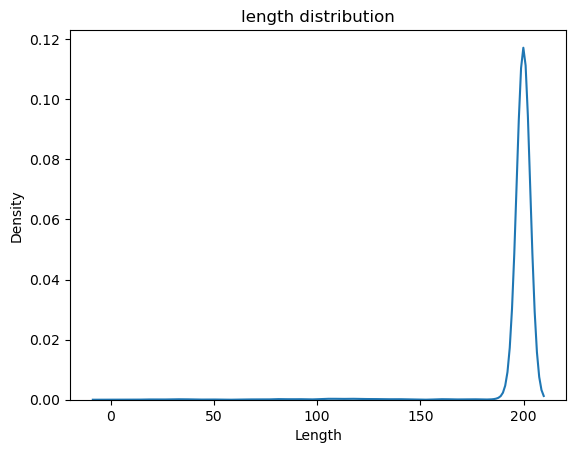

In [181]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure()
sns.kdeplot(x= df_gsmail['Length'],data = df_gsmail).set_title('length distribution')
plt.show()

In [182]:
df_gsmail[df_gsmail['Length'] >= 160]['Direction'].value_counts()

Direction
Inbound     1412
Outbound    1321
Name: count, dtype: int64

In [183]:
df_gsmail[df_gsmail['Length'] >= 160]['New Conversation'].value_counts()

New Conversation
0    1547
1    1186
Name: count, dtype: int64

In [184]:
stpwrd = nltk.corpus.stopwords.words('english')

stpwrd[:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [185]:
count_vectorizer = CountVectorizer(stop_words=stpwrd)

In [186]:
counts = count_vectorizer.fit_transform(corpus)

In [187]:
counts_df =  pd.DataFrame(counts.toarray(), columns = count_vectorizer.get_feature_names_out())
counts_df.head()

aaf  aaron  aaronjjordan  ab  aba  abbo  abbott  aberdeen  abf  ability  \
0    0      0             0   0    0     0       0         0    0        0   
1    0      0             0   0    0     0       0         0    0        0   
2    0      0             0   0    0     0       0         0    0        0   
3    0      0             0   0    0     0       0         0    0        0   
4    0      0             0   0    0     0       0         0    0        0   

   able  ablett  abou  abovement  abraham  absolute  absolutely  abuse  \
0     0       0     0          0        0         0           0      0   
1     0       0     0          0        0         0           0      0   
2     0       0     0          0        0         0           0      0   
3     0       0     0          0        0         0           0      0   
4     0       0     0          0        0         0           0      0   

   abusive  ac  acc  accept  acceptance  accepted  accepting  access  \
0        0   0    0       0           0         0          0       0   
1        0   0    0       0           0         0          0       0   
2        0   0    0       0           0         0          0       0   
3        0   0    0       0           0         0          0       0   
4        0   0    0       0           0         0          0       0   

   accessed  accessory  acco  according  accordingly  accoun  account  \
0         0          0     0          0            0       0        0   
1         0          0     0          0            0       0        0   
2         0          0     0          0            0       0        0   
3         0          0     0          0            0       0        0   
4         0          0     0          0            0       0        0   

   accumalting  accurately  ackandpacktoo  aco  acon  acp  across  acrylic  \
0            0           0              0    0     0    0       0        0   
1            0           0              0    0     0    0       0        0   
2            0           0              0    0     0    0       0        0   
3            0           0              0    0     0    0       0        0   
4            0           0              0    0     0    0       0        0   

   act  acti  acting  action  actionfraud  activ  activa  activate  activated  \
0    0     0       0       0            0      0       0         0          0   
1    0     0       0       0            0      0       0         0          0   
2    0     0       0       0            0      0       0         0          0   
3    0     0       0       0            0      0       0         0          0   
4    0     0       0       0            0      0       0         0          0   

   active  actually  actualmotts  ad  adam  adamevans  adamfoyle  adamgallow  \
0       0         1            0   1     0          0          0           0   
1       0         1            0   1     0          0          0           0   
2       0         0            0   1     0          0          0           0   
3       0         0            0   1     0          0          0           0   
4       0         0            0   0     0          0          0           0   

   adamgalloway  adamtingle  adapter  adaptivecooling  add  added  adder  \
0             0           0        0                0    1      0      0   
1             0           0        0                0    1      0      0   
2             0           0        0                0    2      0      0   
3             0           0        0                0    0      0      0   
4             0           0        0                0    0      0      0   

   adding  addington  addingtonfamily  additional  additionally  addre  \
0       0          0                0           0             0      0   
1       0          0                0           0             0      0   
2       0          0                0           0             0      0   
3       0          0       

In [188]:
# counting terms
counts_dict = {}

# Store the words as key-value pairs
for ii, word in enumerate(counts_df.columns):
    counts_dict[word] = sum(counts_df[str(word)])
    word_count = [(i,count) for i,count in list(zip(counts_dict.keys(), counts_dict.values()))]

In [189]:
sorted_counts = sorted(word_count, key = lambda x: x[1], reverse = True)
sorted_counts[:40]

[('message', 1925),
 ('ad', 1841),
 ('hi', 1636),
 ('email', 1262),
 ('thank', 1098),
 ('name', 1080),
 ('new', 994),
 ('id', 972),
 ('received', 960),
 ('please', 903),
 ('contacting', 882),
 ('com', 826),
 ('know', 732),
 ('support', 729),
 ('gunstar', 678),
 ('co', 630),
 ('uk', 630),
 ('concern', 571),
 ('thanks', 535),
 ('account', 508),
 ('letting', 460),
 ('detail', 441),
 ('advert', 428),
 ('see', 413),
 ('fine', 374),
 ('believe', 367),
 ('gmail', 365),
 ('hope', 359),
 ('live', 357),
 ('well', 356),
 ('log', 332),
 ('pulled', 327),
 ('hello', 301),
 ('sent', 279),
 ('seller', 257),
 ('visit', 247),
 ('help', 244),
 ('wrote', 241),
 ('hotmail', 231),
 ('paid', 218)]

# Gunstar - Mail

In [190]:
corpus_temp = []

text = list(df_gsmail[df_gsmail['Length']<160].Extract)

for i in range(len(text)):
    r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
    r = r.lower()
    r = r.split()
#     r = [word for word in r if word not in stopwords.words('english')]
#     r = [lemmatizer.lemmatize(word) for word in r]
    r = ' '.join(r)
    corpus_temp.append(r)

In [191]:
corpus_temp

['thank you sent from outlook for android',
 '',
 'screen shots of transactions sent from my iphone',
 'we haven t gotten any update from the relevant team yet once we get it we will definitely reach you back',
 'hi david it should work on both platforms can you please confirm the device you re using',
 'hi thomas here is an email for you',
 'i have just taken off the ad and marked for verification further our team will look into this matter regards syed tech customer support',
 'hi greg thanks for reaching out to us may i know your city name so i can amend it for you',
 'hi this is syed on live help support at fmg on sunday feb at am shaun sh gmail com wrote speak to agent',
 'hi martin here is your new password for your gunstar account password gs',
 'hi can you please share your city county and postcode with me so i can try to change it from our side',
 'hello there thank you for your reply we have processed a refund for the duplicate ads which will be back in your account within th

In [192]:
counts = count_vectorizer.fit_transform(corpus_temp)

In [193]:
counts_df =  pd.DataFrame(counts.toarray(), columns = count_vectorizer.get_feature_names_out())
counts_df.head()

,accordingly,account,accounts,activate,active,ad,add,address,ads,advert,agent,agreed,aiq,air,ajmal,alright,also,amend,amount,android,anything,arms,artemis,asking,assist,assistance,attached,back,brain,brno,bronze,browser,business,carbine,category,change,chat,check,checked,city,co,code,com,concern,confirm,contact,contacting,could,county,customer,dave,david,days,definitely,details,device,discount,duplicate,elaborate,else,email,escalated,experience,feb,filters,find,fmg,folder,forwarded,gbp,get,give,gmail,gotten,greg,gs,gun,guns,gunstar,hello,help,hesitation,hi,history,hope,https,hunter,inconvenience,internet,ipad,iphone,issue,issues,justin,know,landed,let,linked,live,look,made,main,many,marked,martin,martyn,mate,matter,may,mentioned,michaelfaulkender,might,mk,money,much,name,need,new,next,number,option,order,outlook,package,paid,password,payment,photo,photographs,photos,picture,place,platforms,please,post,postcode,posting,price,processed,product,rae,reach,reaching,receive,received,reduced,ref,refund,regards,relevant,removed,reply,resolution,rifles,robet,said,sale,screen,screenshot,screenshots,second,see,select,seller,send,sent,sh,share,sharing,shaun,shots,side,sorry,spam,speak,steve,still,subcategory,sunday,support,syed,taken,talking,tau,team,tech,technical,thank,thanks,thomas,title,transactions,try,tx,uk,un,unable,update,updated,upgrade,upgraded,us,use,using,verification,verify,want,wants,website,well,within,without,work,wrote,www,yet
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0


In [194]:
# counting terms
counts_dict = {}

# Store the words as key-value pairs
for ii, word in enumerate(counts_df.columns):
    counts_dict[word] = sum(counts_df[str(word)])
    word_count = [(i,count) for i,count in list(zip(counts_dict.keys(), counts_dict.values()))]

In [195]:
sorted_counts = sorted(word_count, key = lambda x: x[1], reverse = True)
sorted_counts[:40]

[('hi', 34),
 ('please', 27),
 ('ad', 16),
 ('hope', 15),
 ('well', 15),
 ('thanks', 14),
 ('us', 10),
 ('email', 8),
 ('live', 8),
 ('know', 7),
 ('payment', 7),
 ('reaching', 7),
 ('air', 6),
 ('let', 6),
 ('look', 6),
 ('account', 5),
 ('back', 5),
 ('check', 5),
 ('get', 5),
 ('screenshot', 5),
 ('share', 5),
 ('team', 5),
 ('attached', 4),
 ('confirm', 4),
 ('hello', 4),
 ('need', 4),
 ('received', 4),
 ('reply', 4),
 ('sent', 4),
 ('ads', 3),
 ('assistance', 3),
 ('business', 3),
 ('checked', 3),
 ('days', 3),
 ('issue', 3),
 ('next', 3),
 ('see', 3),
 ('sorry', 3),
 ('syed', 3),
 ('active', 2)]

In [196]:
df['Inbox'].value_counts()

Inbox
Live Chat - FAD             23690
Callbacks                    7171
Email - FAD                  6337
Live Chat - Wightbay         6110
Email - Internet Support     3030
Email - Gunstar              2793
Live Chat - Caravans         2738
Live Chat - Gunstar          2386
Live Chat - Horsemart        2268
Email - Horseclicks          2094
Email - Caravans             1668
Email - Horsemart            1497
Live Chat - Horseclicks       617
Email - Wightbay              612
Email - UpCountry             552
Email - Birdtrader            510
Email - Dogs & Puppies        241
Email - Kitten Ads            175
Spidersnet - 999               24
Spidersnet Support             19
Email - BS24Support             1
Name: count, dtype: int64

In [197]:
df_wblive = df[df['Inbox']=='Live Chat - Wightbay']

In [198]:
df_wblive.shape

(6110, 26)

In [199]:
df_wbmail = df[df['Inbox']=='Email - Wightbay']

In [200]:
df_wbmail.shape

(612, 26)

# <div class = 'alert alert-success'>Wightbay</div>

# Wightbay - Live

In [201]:
df_wbchats = df_wblive[['Message ID','Extract']]

In [202]:
df_wbchats.head()

,Message ID,Extract
18,34814964420,Looking for hardshell large suitcase with fou...
19,34814967172,User submitted their email: alataylor@gmail.com
67,34819999236,Remove all my old ads
68,34819999364,"Hi, thanks for contacting us, sorry but we are..."
74,34821818436,Hi there could u tell me when my advert will g...


In [203]:
# Lemmatize
lemmatizer = WordNetLemmatizer()

In [204]:
df_wblive.shape

(6110, 26)

In [205]:
df_wblive = df_wblive[df_wblive['Direction']=='Inbound']

In [206]:
df_wblive.shape

(2028, 26)

In [207]:
corpus = []

text = list(df_wblive['Extract'])

for i in range(len(text)):
    r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
    r = r.lower()
    r = r.split()
    r = [word for word in r if word not in stopwords.words('english')]
    r = [lemmatizer.lemmatize(word) for word in r]
    r = ' '.join(r)
    corpus.append(r)

In [208]:
corpus

['looking hardshell large suitcase four wheel',
 'user submitted email alataylor gmail com',
 'remove old ad',
 'hi could u tell advert go live please',
 'user submitted email shauncoxy gmail com',
 'mean advert review',
 'hi could tell advert go live thanks',
 'user submitted email barrydenny ymail com',
 'close couple toilet good condition white free',
 'closecoupled toilet good condition',
 'closecoupled toilet good condition white free collect',
 'item review',
 'hi trying change email address phone number account saying email address already exists enter correct phone number cant change help',
 '',
 'jmc cleaning co hotmail co uk',
 'registered phone number longer exists',
 '',
 'would easier created new account business',
 'sorry pain please disregard conversation wife account going make',
 'thank anyway good evening',
 'thought ad free charged post',
 'hello leave review someone bought',
 'add photo ad',
 'free collect ad sofa',
 'need see add image',
 'jpeg',
 'wher put form fi

In [209]:
from collections import Counter  
  
# counts word frequency 
def count_words(text):                   
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = {}  
    for word in text.split(" "):  
        if word in word_counts:  
            word_counts[word]+= 1 
        else:  
            word_counts[word]= 1 
    return word_counts

In [210]:
def count_words_fast(text):      
    text = text.lower()  
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = Counter(text.split(" "))  
    return word_counts  

In [211]:
count_words(corpus[0])

{'looking': 1,
 'hardshell': 1,
 'large': 1,
 'suitcase': 1,
 'four': 1,
 'wheel': 1}

In [212]:
df_wblive['Length'] = df_wblive['Extract'].str.len()

In [213]:
df_wblive.head(2)

,Message ID,Conversation ID,Segment,Direction,Status,Inbox,Inbox API ID,Message date,Autoreply,Attributed to,Contact name,Contact handle,To,Extract,Tags,Tag API IDs,Message API ID,Conversation API ID,New Conversation,First response,Business hours,Subject,Segment start,Segment end,Segment closed,Last segment activity,Length
18,34814964420,22160788292,1,Inbound,Archived,Live Chat - Wightbay,inb_4lru,2023-01-01 11:11:54,0,internet,NaN,c4b4f5a5-54c6-4e78-b392-41f2b1849e26,9042b326-f53d-11e7-9eb8-ff17fb32fc6a,Looking for hardshell large suitcase with fou...,"WB,Umer Butt,Other","tag_1sbrm,tag_i5kzo,tag_41610",msg_fzrxih0,cnv_a6hylok,1,0,0,NaN,2023-01-01 11:11:54,NaN,NaN,NaN,54.0
19,34814967172,22160788292,1,Inbound,Archived,Live Chat - Wightbay,inb_4lru,2023-01-01 11:12:25,0,internet,NaN,c4b4f5a5-54c6-4e78-b392-41f2b1849e26,9042b326-f53d-11e7-9eb8-ff17fb32fc6a,User submitted their email: alataylor@gmail.com,"WB,Umer Butt,Other","tag_1sbrm,tag_i5kzo,tag_41610",msg_fzrxklg,cnv_a6hylok,0,0,0,NaN,2023-01-01 11:11:54,NaN,NaN,NaN,47.0


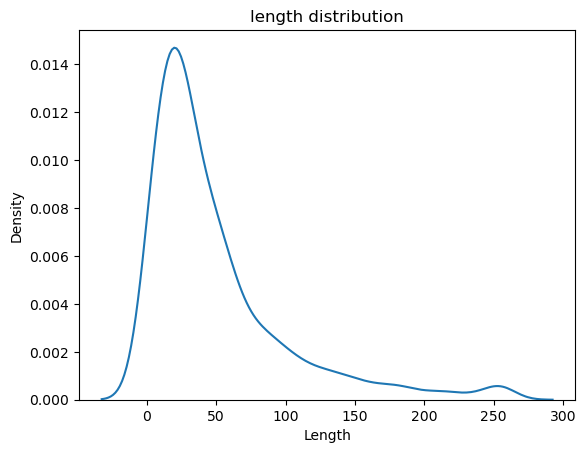

In [214]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure()
sns.kdeplot(x= df_wblive['Length'],data = df_gslive).set_title('length distribution')
plt.show()

In [215]:
df_wblive['New Conversation'].value_counts()

New Conversation
0    1522
1     506
Name: count, dtype: int64

In [216]:
df_wblive['Direction'].value_counts()

Direction
Inbound    2028
Name: count, dtype: int64

In [217]:
df_wbmail['Direction'].value_counts()

Direction
Outbound    341
Inbound     271
Name: count, dtype: int64

In [218]:
stpwrd = nltk.corpus.stopwords.words('english')

stpwrd[:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [219]:
count_vectorizer = CountVectorizer(stop_words=stpwrd)

In [220]:
counts = count_vectorizer.fit_transform(corpus)

In [221]:
counts_df =  pd.DataFrame(counts.toarray(), columns = count_vectorizer.get_feature_names_out())
counts_df.head()

aaaaagggghhhhh  aadd  ab  able  abusive  abv  acc  accept  accepted  \
0               0     0   0     0        0    0    0       0         0   
1               0     0   0     0        0    0    0       0         0   
2               0     0   0     0        0    0    0       0         0   
3               0     0   0     0        0    0    0       0         0   
4               0     0   0     0        0    0    0       0         0   

   access  accessory  accidentally  accommodation  according  account  accout  \
0       0          0             0              0          0        0       0   
1       0          0             0              0          0        0       0   
2       0          0             0              0          0        0       0   
3       0          0             0              0          0        0       0   
4       0          0             0              0          0        0       0   

   acessories  achieves  across  action  activate  activated  active  \
0           0         0       0       0         0          0       0   
1           0         0       0       0         0          0       0   
2           0         0       0       0         0          0       0   
3           0         0       0       0         0          0       0   
4           0         0       0       0         0          0       0   

   actually  ad  adam  adamdcampbell  add  added  adding  addrees  address  \
0         0   0     0              0    0      0       0        0        0   
1         0   0     0              0    0      0       0        0        0   
2         0   1     0              0    0      0       0        0        0   
3         0   0     0              0    0      0       0        0        0   
4         0   0     0              0    0      0       0        0        0   

   adequate  adlawson  admin  adsd  adunne  advert  advertise  advertised  \
0         0         0      0     0       0       0          0           0   
1         0         0      0     0       0       0          0           0   
2         0         0      0     0       0       0          0           0   
3         0         0      0     0       0       1          0           0   
4         0         0      0     0       0       0          0           0   

   advertisement  advertiser  advertises  advertising  advertisment  advice  \
0              0           0           0            0             0       0   
1              0           0           0            0             0       0   
2              0           0           0            0             0       0   
3              0           0           0            0             0       0   
4              0           0           0            0             0       0   

   advise  advised  af  afternoon  ag  age  aggregate  ago  agreeing  ah  air  \
0       0        0   0          0   0    0          0    0         0   0    0   
1       0        0   0          0   0    0          0    0         0   0    0   
2       0        0   0          0   0    0          0    0         0   0    0   
3       0        0   0          0   0    0          0    0         0   0    0   
4       0        0   0          0   0    0          0    0         0   0    0   

   ajmal  al  alanrclark  alataylor  alert  alex  alexander  alexbetteridge  \
0      0   0           0          0      0     0          0               0   
1      0   0           0          1      0     0          0               0   
2      0   0           0          0      0     0          0               0   
3      0   0           0          0      0     0          0               0   
4      0   0           0          0      0     0          0               0   

   alison  allow  allowed  allowing  allows  allure  almost  already  alredy  \
0       0      0        0         0       0       0       0        0       0   
1       0      0        0         0       0       0       0        0       0   
2       0      0        0    

In [222]:
# counting terms
counts_dict = {}

# Store the words as key-value pairs
for ii, word in enumerate(counts_df.columns):
    counts_dict[word] = sum(counts_df[str(word)])
    word_count = [(i,count) for i,count in list(zip(counts_dict.keys(), counts_dict.values()))]

In [223]:
sorted_counts = sorted(word_count, key = lambda x: x[1], reverse = True)
sorted_counts[:40]

[('ad', 332),
 ('com', 253),
 ('please', 167),
 ('email', 160),
 ('thank', 149),
 ('advert', 146),
 ('hi', 137),
 ('add', 133),
 ('thanks', 120),
 ('free', 106),
 ('gmail', 106),
 ('uk', 90),
 ('co', 87),
 ('hotmail', 77),
 ('help', 76),
 ('ok', 75),
 ('yes', 74),
 ('user', 73),
 ('account', 72),
 ('trying', 65),
 ('live', 62),
 ('wightbay', 61),
 ('get', 60),
 ('submitted', 59),
 ('photo', 58),
 ('one', 56),
 ('number', 53),
 ('still', 53),
 ('item', 51),
 ('need', 50),
 ('say', 50),
 ('address', 49),
 ('hello', 48),
 ('message', 48),
 ('place', 47),
 ('go', 45),
 ('change', 44),
 ('paid', 42),
 ('pay', 42),
 ('sale', 42)]

# Email - Wightbay

In [224]:
df_wbmail_in = df_wbmail[df_wbmail['Direction']=='Inbound']

In [225]:
corpus = []

text = list(df_wbmail_in['Extract'])

for i in range(len(text)):
    r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
    r = r.lower()
    r = r.split()
    r = [word for word in r if word not in stopwords.words('english')]
    r = [lemmatizer.lemmatize(word) for word in r]
    r = ' '.join(r)
    corpus.append(r)

In [226]:
corpus

['dear brilliant wightbay make suggestion please away item still available button drive mad people hit button reply never hear',
 'would like reactivate account many thanks',
 'great thank much wed jan support wightbay com support wightbay com wrote hi peter believe fine thank contacting u letting u know',
 'registered wightbay say please correct brenda mouland',
 'thank e mail still place ad told e mail address registered going original message support wightbay com support wightbay',
 'want place urgent ad please original message support wightbay com support wightbay com brendamouland brendamouland btinternet com sent friday jan',
 'thank original message support wightbay com support wightbay com brendamouland brendamouland btinternet com sent friday jan subject problem',
 'hooray placed ad thank original message support wightbay com support wightbay com brendamouland brendamouland btinternet com sent friday jan',
 'morning like make ad prominent seem able see attached photo could adv

In [227]:
from collections import Counter  
  
# counts word frequency 
def count_words(text):                   
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = {}  
    for word in text.split(" "):  
        if word in word_counts:  
            word_counts[word]+= 1 
        else:  
            word_counts[word]= 1 
    return word_counts

In [228]:
def count_words_fast(text):      
    text = text.lower()  
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = Counter(text.split(" "))  
    return word_counts  

In [229]:
count_words(corpus[0])

{'dear': 1,
 'brilliant': 1,
 'wightbay': 1,
 'make': 1,
 'suggestion': 1,
 'please': 1,
 'away': 1,
 'item': 1,
 'still': 1,
 'available': 1,
 'button': 2,
 'drive': 1,
 'mad': 1,
 'people': 1,
 'hit': 1,
 'reply': 1,
 'never': 1,
 'hear': 1}

In [230]:
df_wbmail_in['Length'] = df_wbmail_in['Extract'].str.len()

In [231]:
df_wbmail_in.head(2)

,Message ID,Conversation ID,Segment,Direction,Status,Inbox,Inbox API ID,Message date,Autoreply,Attributed to,Contact name,Contact handle,To,Extract,Tags,Tag API IDs,Message API ID,Conversation API ID,New Conversation,First response,Business hours,Subject,Segment start,Segment end,Segment closed,Last segment activity,Length
667,34856512196,22185269188,1,Inbound,Archived,Email - Wightbay,inb_f6qi,2023-01-03 22:40:48,0,support,Yvonne Yelland,yvonnejyelland@gmail.com,support@wightbay.com,Dear Brilliant Wightbay Can I make a suggestio...,"Syed Muhammad,Other","tag_i5kxw,tag_41610",msg_g0go0xw,cnv_a6wjb9g,1,0,0,Re: Happy New Year!,2023-01-03 22:40:48,NaN,NaN,NaN,200
891,34879586692,22200591108,1,Inbound,Archived,Email - Wightbay,inb_f6qi,2023-01-04 18:22:21,0,support,Peter Baldwyn,email4peterb@gmail.com,support@wightbay.com,I would like to reactivate my account. Many th...,"Syed Muhammad,I cannot log in to my account","tag_i5kxw,tag_415tw",msg_g0uelc4,cnv_a75npqc,1,0,0,Re: Account reactivation,2023-01-04 18:22:21,NaN,NaN,NaN,51


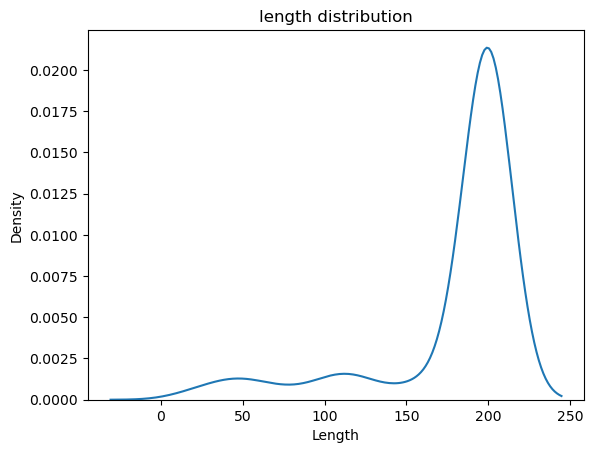

In [232]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure()
sns.kdeplot(x= df_wbmail_in['Length'],data = df_wbmail_in).set_title('length distribution')
plt.show()

In [233]:
df_wbmail_in['New Conversation'].value_counts()

New Conversation
1    137
0    134
Name: count, dtype: int64

In [234]:
df_wbmail_in['Direction'].value_counts()

Direction
Inbound    271
Name: count, dtype: int64

In [235]:
stpwrd = nltk.corpus.stopwords.words('english')

stpwrd[:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [236]:
count_vectorizer = CountVectorizer(stop_words=stpwrd)

In [237]:
counts = count_vectorizer.fit_transform(corpus)

In [238]:
counts_df =  pd.DataFrame(counts.toarray(), columns = count_vectorizer.get_feature_names_out())
counts_df.head()

,aberd,able,accept,acceptable,accepted,accepting,access,accord,according,account,acti,activate,activated,active,actually,ad,adam,add,added,adding,additional,address,addressed,adrian,adve,advert,advertise,advertised,advertisement,advertising,advise,advises,afraid,afternoon,age,ago,ajmal,alan,alanrclark,alert,allow,allowed,allowing,almost,alpinaman,already,also,although,always,amazing,amount,android,andy,anita,ann,anne,annkeefe,another,answer,anybody,anyone,anything,anywhere,app,apparently,appea,appear,appearing,appears,apply,appreciate,approach,appropriate,apr,april,arcona,arksen,arnold,around,asad,ascott,ask,asked,asking,asks,assist,assumed,astoria,atm,attach,attached,atte,attempt,attempting,aug,august,auto,available,aware,away,axopar,back,bad,balance,bank,based,basic,bay,bayldon,beaver,bed,bee,begin,behalf,behaviour,believe,beneteau,best,beyond,bigman,bike,bit,blank,blocked,bn,boa,board,boat,bon,booked,boosted,bother,bottom,bowc,bowcombe,bowes,brackenbury,brass,breeder,brenda,brendamouland,brett,brier,brighton,brilliant,bring,bringing,brought,browse,browser,bst,bt,btinternet,bulgaria,business,buts,button,buy,buyer,buying,ca,call,called,campaign,cancel,cannot,cant,capo,car,caravan,card,carefully,carpenter,carpet,cart,cash,category,causing,centre,ch,cha,chair,change,changed,chaplow,charge,chargeable,charged,chat,check,checked,cheer,chest,chose,christine,cindy,claire,clare,clarifying,clark,class,classic,clean,clearly,click,clicked,client,clock,closed,closely,co,code,collect,collection,collector,com,come,coming,commercial,company,competence,competitor,complain,complete,completed,completing,complicated,compound,computer,con,concern,concerned,condencer,condones,confirm,confirmation,confuse,confusing,congratulation,connected,constantly,contact,contacted,contacting,contractor,correct,correctly,cost,cottage,could,couple,courier,coveinience,cowes,create,created,crescent,cruelty,currently,cut,cutting,daemon,dash,dashboard,data,date,david,davidsaintpaul,davis,day,de,deactivated,deadman,dealer,dealerunlimited,dean,dear,debit,dec,december,decor,delay,delete,deleted,delivery,dell,department,description,despite,detail,development,device,di,diagnosing,didskid,dietitian,different,difficult,difficulty,dimension,dinghy,director,disappointed,discount,discussed,dismembered,displaying,diy,dns,dog,done,draft,drier,drive,drop,dropped,dufour,dvc,earlier,earliest,easier,east,easy,echc,edit,edited,edits,effect,eilly,either,electric,else,email,emailed,emailing,empty,enable,enclosed,end,eng,enquiry,enter,entry,error,escalate,escalated,estate,etc,eternal,ethical,even,evening,ever,evertime,every,everything,everytime,ew,excepted,exhibitor,existing,experience,expired,expires,expiring,explain,explaining,extra,fact,fair,fake,fannying,fantastic,far,faulty,featured,feb,fee,feel,feltham,field,file,filling,finance,find,fine,first,flagged,flux,fluxie,fmg,focus,following,follows,ford,forgotten,forwarded,foster,found,four,fox,fr,free,frequently,freshw,freshwater,fri,friday,fridge,fro,full,galaxy,galeon,garage,garden,garry,gary,gave,general,genius,genuine,georgina,geri,get,getting,give,given,glass,gmail,gmt,gmx,go,godshill,going,gone,good,goodrum,goody,google,googlemail,got,gq,grant,grateful,gray,great,greeting,ground,group,grove,guidance,guitar,guy,halt,handybigfoot,happenin,happens,hard,harrison,harry,hawes,header,heading,hear,heard,hedge,hello,help,helpful,helping,henretty,heritage,hey,hi,hit,hiya,home,honest,honey,hooray,hope,hopefully,hoping,hotel,hotmail,hour,house,howard,however,http,hughes,hull,husband,hw,hz,id,im,image,immediately,inactive,include,incorrect,incorrectly,increase,incubator,indeed,inflatable,info,inform,information,informed,insect,interest,io,iow,ip,ipad,iphone,iron,irritating,isle,issue,item,ive,jack,jake,jan,jane,january,jaymortimer,jayne,jc,je,jeanneau,jenny,jennyk,job,john,johnmackett,join,josh,jrich,judy,jul,jules,julius,july,june,kate,kayak,keep,kevin,ki,kidd,kind,kindest,king,kingdom,kit,know,labelled,lagoon,land,laptop,last,le,leanne,leas

In [239]:
# counting terms
counts_dict = {}

# Store the words as key-value pairs
for ii, word in enumerate(counts_df.columns):
    counts_dict[word] = sum(counts_df[str(word)])
    word_count = [(i,count) for i,count in list(zip(counts_dict.keys(), counts_dict.values()))]

In [240]:
sorted_counts = sorted(word_count, key = lambda x: x[1], reverse = True)
sorted_counts[:40]

[('wightbay', 162),
 ('support', 127),
 ('com', 124),
 ('hi', 115),
 ('please', 84),
 ('ad', 80),
 ('thanks', 74),
 ('advert', 71),
 ('sent', 67),
 ('thank', 67),
 ('wrote', 49),
 ('account', 48),
 ('car', 43),
 ('regard', 34),
 ('email', 31),
 ('many', 31),
 ('hello', 30),
 ('help', 28),
 ('still', 26),
 ('cannot', 22),
 ('morning', 22),
 ('see', 21),
 ('anne', 20),
 ('contacting', 20),
 ('get', 20),
 ('could', 19),
 ('free', 19),
 ('good', 19),
 ('know', 19),
 ('live', 19),
 ('syed', 19),
 ('change', 18),
 ('ipad', 18),
 ('tried', 18),
 ('like', 17),
 ('renew', 17),
 ('bowcombe', 16),
 ('photo', 16),
 ('code', 15),
 ('kind', 15)]

In [241]:
df['Inbox'].value_counts()

Inbox
Live Chat - FAD             23690
Callbacks                    7171
Email - FAD                  6337
Live Chat - Wightbay         6110
Email - Internet Support     3030
Email - Gunstar              2793
Live Chat - Caravans         2738
Live Chat - Gunstar          2386
Live Chat - Horsemart        2268
Email - Horseclicks          2094
Email - Caravans             1668
Email - Horsemart            1497
Live Chat - Horseclicks       617
Email - Wightbay              612
Email - UpCountry             552
Email - Birdtrader            510
Email - Dogs & Puppies        241
Email - Kitten Ads            175
Spidersnet - 999               24
Spidersnet Support             19
Email - BS24Support             1
Name: count, dtype: int64

# <div class = 'alert alert-success'>Internet Support</div>

# Email - Internet support

In [242]:
df_emailsupport = df[df['Inbox']=='Email - Internet Support']

In [243]:
df_emailsupport.shape

(3030, 26)

In [244]:
df_emailsupport['Length'] = df_emailsupport['Extract'].str.len()

In [245]:
df_es_chats = df_emailsupport[['Message ID','Extract']]

In [246]:
df_es_chats.head()

,Message ID,Extract
1,34813192388,I apologize for this automatic reply to your e...
11,34813413444,I apologize for this automatic reply to your e...
13,34813445060,I apologize for this automatic reply to your e...
15,34813893828,I apologize for this automatic reply to your e...
17,34813940548,I apologize for this automatic reply to your e...


In [247]:
# Lemmatize
lemmatizer = WordNetLemmatizer()

In [248]:
df_emailsupport.shape

(3030, 27)

In [249]:
df_email_in = df_emailsupport[df_emailsupport['Direction']=='Inbound']

In [250]:
df_email_in.shape

(2067, 27)

In [251]:
corpus = []

text = list(df_email_in['Extract'])

for i in range(len(text)):
    r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
    r = r.lower()
    r = r.split()
    r = [word for word in r if word not in stopwords.words('english')]
    r = [lemmatizer.lemmatize(word) for word in r]
    r = ' '.join(r)
    corpus.append(r)

In [252]:
corpus

['apologize automatic reply email control spam allow incoming message sender approved beforehand would like added list approved se',
 'apologize automatic reply email control spam allow incoming message sender approved beforehand would like added list approved se',
 'apologize automatic reply email control spam allow incoming message sender approved beforehand would like added list approved se',
 'apologize automatic reply email control spam allow incoming message sender approved beforehand would like added list approved se',
 'apologize automatic reply email control spam allow incoming message sender approved beforehand would like added list approved se',
 'received new message name charles stock email charles v mg com ad id ad ref hm message dear horsemart ad ref hm horse box sold last summer still receivi',
 'received new message name sarah read email sarahquickwood tiscali co uk ad id message searching connemara thoroughbred cross horse purchase spring tried putti',
 'apologize aut

In [253]:
from collections import Counter  
  
# counts word frequency 
def count_words(text):                   
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = {}  
    for word in text.split(" "):  
        if word in word_counts:  
            word_counts[word]+= 1 
        else:  
            word_counts[word]= 1 
    return word_counts

In [254]:
def count_words_fast(text):      
    text = text.lower()  
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = Counter(text.split(" "))  
    return word_counts  

In [255]:
count_words(corpus[0])

{'apologize': 1,
 'automatic': 1,
 'reply': 1,
 'email': 1,
 'control': 1,
 'spam': 1,
 'allow': 1,
 'incoming': 1,
 'message': 1,
 'sender': 1,
 'approved': 2,
 'beforehand': 1,
 'would': 1,
 'like': 1,
 'added': 1,
 'list': 1,
 'se': 1}

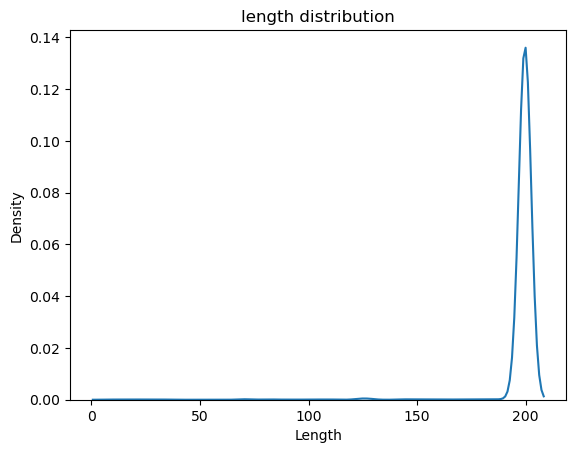

In [256]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure()
sns.kdeplot(x= df_email_in['Length'],data = df_email_in).set_title('length distribution')
plt.show()

In [257]:
df_email_in['New Conversation'].value_counts()

New Conversation
0    1051
1    1016
Name: count, dtype: int64

In [258]:
df_email_in['Direction'].value_counts()

Direction
Inbound    2067
Name: count, dtype: int64

In [259]:
stpwrd = nltk.corpus.stopwords.words('english')

stpwrd[:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [260]:
count_vectorizer = CountVectorizer(stop_words=stpwrd)

In [261]:
counts = count_vectorizer.fit_transform(corpus)

In [262]:
counts_df =  pd.DataFrame(counts.toarray(), columns = count_vectorizer.get_feature_names_out())
counts_df.head()

aa  aaf  aardahl  ab  abarcattle  abbie  abbieemms  abbostsford  abby  abc  \
0   0    0        0   0           0      0          0            0     0    0   
1   0    0        0   0           0      0          0            0     0    0   
2   0    0        0   0           0      0          0            0     0    0   
3   0    0        0   0           0      0          0            0     0    0   
4   0    0        0   0           0      0          0            0     0    0   

   abercrombie  abernathy  abided  abilene  able  ac  accept  access  accide  \
0            0          0       0        0     0   0       0       0       0   
1            0          0       0        0     0   0       0       0       0   
2            0          0       0        0     0   0       0       0       0   
3            0          0       0        0     0   0       0       0       0   
4            0          0       0        0     0   0       0       0       0   

   accident  accou  account  accountant  acct  ace  acknowledge  across  \
0         0      0        0           0     0    0            0       0   
1         0      0        0           0     0    0            0       0   
2         0      0        0           0     0    0            0       0   
3         0      0        0           0     0    0            0       0   
4         0      0        0           0     0    0            0       0   

   action  active  activity  actual  actually  ad  adam  adayra  add  added  \
0       0       0         0       0         0   0     0       0    0      1   
1       0       0         0       0         0   0     0       0    0      1   
2       0       0         0       0         0   0     0       0    0      1   
3       0       0         0       0         0   0     0       0    0      1   
4       0       0         0       0         0   0     0       0    0      1   

   adding  additional  address  addressee  ade  adele  adrees  adress  adrian  \
0       0           0        0          0    0      0       0       0       0   
1       0           0        0          0    0      0       0       0       0   
2       0           0        0          0    0      0       0       0       0   
3       0           0        0          0    0      0       0       0       0   
4       0           0        0          0    0      0       0       0       0   

   adult  adv  adve  adver  adverb  advert  advertise  advertised  \
0      0    0     0      0       0       0          0           0   
1      0    0     0      0       0       0          0           0   
2      0    0     0      0       0       0          0           0   
3      0    0     0      0       0       0          0           0   
4      0    0     0      0       0       0          0           0   

   advertisement  advertiser  advertising  advi  advice  advise  advised  \
0              0           0            0     0       0       0        0   
1              0           0            0     0       0       0        0   
2              0           0            0     0       0       0        0   
3              0           0            0     0       0       0        0   
4              0           0            0     0       0       0        0   

   advises  ae  af  afc  affiliated  aforbes  afraid  aft  afternoon  ag  age  \
0        0   0   0    0           0        0       0    0          0   0    0   
1        0   0   0    0           0        0       0    0          0   0    0   
2        0   0   0    0           0        0       0    0          0   0    0   
3        0   0   0    0           0        0       0    0          0   0    0   
4        0   0   0    0           0        0       0    0          0   0    0   

   agenciasubido  aggelos  ago  agree  agreed  ah  ahold  ahopewel  aie  \
0              0        0    0      0       0   0      0         0    0   
1              0        0    0      0       0   0      0         0    0   
2              0        0    0      0 

In [263]:
# counting terms
counts_dict = {}

# Store the words as key-value pairs
for ii, word in enumerate(counts_df.columns):
    counts_dict[word] = sum(counts_df[str(word)])
    word_count = [(i,count) for i,count in list(zip(counts_dict.keys(), counts_dict.values()))]

In [264]:
sorted_counts = sorted(word_count, key = lambda x: x[1], reverse = True)
sorted_counts[:40]

[('message', 1945),
 ('email', 1317),
 ('ad', 992),
 ('approved', 990),
 ('uid', 908),
 ('com', 856),
 ('mdb', 846),
 ('id', 832),
 ('prod', 809),
 ('alert', 797),
 ('name', 759),
 ('rule', 715),
 ('new', 683),
 ('received', 672),
 ('firing', 656),
 ('would', 566),
 ('reply', 558),
 ('like', 557),
 ('list', 535),
 ('instance', 531),
 ('automatic', 516),
 ('allow', 505),
 ('control', 505),
 ('spam', 505),
 ('apologize', 503),
 ('incoming', 503),
 ('se', 501),
 ('added', 500),
 ('sender', 499),
 ('beforehand', 494),
 ('ro', 488),
 ('sync', 421),
 ('grafana', 368),
 ('alertname', 354),
 ('folder', 354),
 ('grouped', 354),
 ('hi', 297),
 ('horseclicks', 297),
 ('gmail', 288),
 ('log', 249)]

In [265]:
df['Inbox'].value_counts()

Inbox
Live Chat - FAD             23690
Callbacks                    7171
Email - FAD                  6337
Live Chat - Wightbay         6110
Email - Internet Support     3030
Email - Gunstar              2793
Live Chat - Caravans         2738
Live Chat - Gunstar          2386
Live Chat - Horsemart        2268
Email - Horseclicks          2094
Email - Caravans             1668
Email - Horsemart            1497
Live Chat - Horseclicks       617
Email - Wightbay              612
Email - UpCountry             552
Email - Birdtrader            510
Email - Dogs & Puppies        241
Email - Kitten Ads            175
Spidersnet - 999               24
Spidersnet Support             19
Email - BS24Support             1
Name: count, dtype: int64

# <div class = 'alert alert-success'>Caravans For Sale</div>

# Live Chat - Caravans

In [266]:
df_cfs = df[df['Inbox']=='Live Chat - Caravans']

In [267]:
df_cfs.shape

(2738, 26)

In [268]:
df_cfs['Length'] = df_cfs['Extract'].str.len()

In [269]:
df_cfs_chats = df_cfs[['Message ID','Extract']]

In [270]:
df_cfs_chats.head()

,Message ID,Extract
484,34849383492,"I posted an AD, I paid via email however, when..."
485,34849393668,"Paid via PAYPAL, I mean"
486,34849390468,"Hi, welcome to live help, my name is Ash."
487,34849395460,May I please have your email address and/or yo...
488,34849403012,I have a PAYPAL receipt for £7.99


In [271]:
# Lemmatize
lemmatizer = WordNetLemmatizer()

In [272]:
# corpus_dump = []

corpus_dump = list(df_cfs_chats['Extract'])
corpus_dump
# for i in range(len(text)):
#     r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
#     r = r.lower()
#     r = r.split()
#     r = [word for word in r if word not in stopwords.words('english')]
#     r = [lemmatizer.lemmatize(word) for word in r]
#     r = ' '.join(r)
#     corpus.append(r)

["I posted an AD, I paid via email however, when I log in your website says I dont have any AD's",
 'Paid via PAYPAL, I mean',
 'Hi, welcome to live help, my name is Ash.',
 'May I please have your email address and/or your Ad Reference number so I can pull out your details? ',
 'I have a PAYPAL receipt for £7.99',
 'Please share your receipt with me',
 'jjmoore0257@yahoo.com',
 'Its via Messenger how do i do that',
 'Please hole while I review your details against your email address',
 'I will be right with you',
 'Ok',
 'Did you pay for a Basic Ad? ',
 'I paid £7.99 so what ever Ad that was, the one up from the free Ad, 60 days I believe',
 'Thank you, please hold and I will further review your information',
 'Completed\\nThis week\\nFriday Ad Ltd\\n3 Jan·Payment\\n- £7.99\\n',
 'A copy of my PAYPAL History',
 'Completed\\nThis week\\nFriday Ad Ltd\\n3 Jan·Payment\\n- £7.99\\n',
 'Thank you for holding',
 'I am pleased to confirm that your Ad is now live and you may view the same at 

In [273]:
df_cfs['Direction'].value_counts()

Direction
Outbound    1776
Inbound      962
Name: count, dtype: int64

In [274]:
df_cfs_in = df_cfs[df_cfs['Direction']=='Inbound']

In [275]:
df_cfs_in.shape

(962, 27)

In [276]:
corpus = []

text = list(df_cfs_in['Extract'])

for i in range(len(text)):
    r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
    r = r.lower()
    r = r.split()
    r = [word for word in r if word not in stopwords.words('english')]
    r = [lemmatizer.lemmatize(word) for word in r]
    r = ' '.join(r)
    corpus.append(r)

In [277]:
corpus

['posted ad paid via email however log website say dont ad',
 'paid via paypal mean',
 'paypal receipt',
 'jjmoore yahoo com',
 'via messenger',
 'ok',
 'paid ever ad one free ad day believe',
 'completed nthis week nfriday ad ltd n jan payment n n',
 'copy paypal history',
 'completed nthis week nfriday ad ltd n jan payment n n',
 'thank ash',
 'baily pamplona listed find',
 'ad review mean seem find listing ad ref c b n',
 'ad seems review mean also find ad listing nad ref c b n nono',
 'ad review day',
 'c b edit reduction',
 'yes',
 'ono',
 'thank syed',
 'brilliant nice well',
 'hi placed advertisment need modify live change detail manage add cannot save',
 'david hodge btinternet com',
 'much advertise touring caravan couple week',
 'need info cost advertise caravan',
 'picture',
 'ok thanks',
 'place ad without phone number email',
 'recently advertised motorhome sale caravan motorhome club also put add site today far received email message remove add caravan sale site please',


In [278]:
from collections import Counter  
  
# counts word frequency 
def count_words(text):                   
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = {}  
    for word in text.split(" "):  
        if word in word_counts:  
            word_counts[word]+= 1 
        else:  
            word_counts[word]= 1 
    return word_counts

In [279]:
def count_words_fast(text):      
    text = text.lower()  
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = Counter(text.split(" "))  
    return word_counts  

In [280]:
count_words(corpus[0])

{'posted': 1,
 'ad': 2,
 'paid': 1,
 'via': 1,
 'email': 1,
 'however': 1,
 'log': 1,
 'website': 1,
 'say': 1,
 'dont': 1}

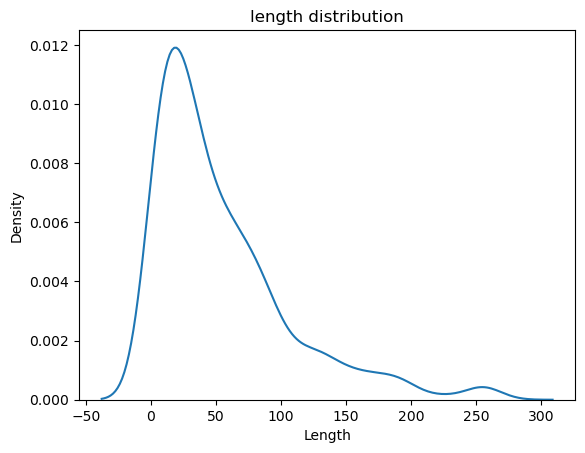

In [281]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure()
sns.kdeplot(x= df_cfs_in['Length'],data = df_cfs_in).set_title('length distribution')
plt.show()

In [282]:
df_cfs_in['New Conversation'].value_counts()

New Conversation
0    786
1    176
Name: count, dtype: int64

In [283]:
df_cfs_in['Direction'].value_counts()

Direction
Inbound    962
Name: count, dtype: int64

In [284]:
stpwrd = nltk.corpus.stopwords.words('english')

stpwrd[:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [285]:
count_vectorizer = CountVectorizer(stop_words=stpwrd)

In [286]:
counts = count_vectorizer.fit_transform(corpus)

In [287]:
counts_df =  pd.DataFrame(counts.toarray(), columns = count_vectorizer.get_feature_names_out())
counts_df.head()

,aa,able,abo,abysmal,accept,access,according,account,acdc,act,action,activate,activated,ad,add,added,addition,additional,address,adfvanced,adria,adv,advance,advanced,advert,advertfrom,advertise,advertised,advertisement,advertising,advertisment,advertthe,advery,advise,advised,afraid,afternoon,agent,ago,agreed,ah,ajmal,alan,alarm,albertsmith,alex,allow,allowing,alpina,already,also,alternative,although,always,amend,amjal,angus,annexe,another,answer,anyone,anything,anyway,aol,apartment,apology,app,appear,appeared,appearing,appears,apply,appox,appreciated,approved,apr,april,argue,argyll,arkut,arrange,arrived,asa,asap,ascotwholesale,ash,ask,asked,asking,asks,assistance,assume,attempt,authorised,auto,available,average,awaiting,aware,away,awindsor,awning,ayaz,ayrshire,ba,back,bailey,baily,bank,basic,belfast,believe,bellis,benefit,ber,berth,better,beyond,big,bike,bill,birth,bit,bless,blue,blurry,bo,body,book,boost,bowden,box,brand,breakdown,brian,bridgend,briefly,brigg,brilliant,brocklesby,browser,bt,btinternet,building,bur,business,button,buy,buyer,buying,bye,byr,cab,call,called,came,campervan,campervans,cancel,cancelled,cannot,cant,cantact,cap,car,caravan,caravanclub,caravanis,caravansforsale,card,cardiff,care,carer,carrier,carry,carvan,case,cash,category,cbc,cecf,cf,change,changed,changing,character,charge,charged,charging,chat,cheaper,cheapest,check,checking,cheek,choose,chose,chosen,chrome,city,claim,classifides,classified,clear,clearly,clever,click,clicked,close,closed,closer,club,clubman,co,coachman,coates,code,colin,colinsarling,collague,com,come,comfortable,coming,commission,committments,common,compact,company,complaint,complete,completed,comprises,computer,condition,confirm,confirmation,confused,connec,connected,consider,considering,contact,continue,continued,continuing,conventional,cook,cool,copy,correct,corrected,correction,correctly,cost,could,county,couple,course,create,creating,credit,cromey,current,customer,cy,damp,daningyan,dashboard,data,database,daveyfred,david,day,dd,deal,debit,decided,declined,default,definately,delay,delete,deleted,deliberately,delivery,deposit,description,deseo,detail,determine,device,dianemichael,didnt,difference,different,difficult,difficulty,digital,dip,direct,disappeared,disclosing,discontinued,discount,discus,disgusting,dismiss,disney,display,dl,dn,doesnt,doncaster,done,dont,draft,dream,drop,dropdown,due,dundee,dunoon,duplicate,earlier,easier,easily,east,edit,edited,either,elddis,elderly,elite,else,email,emailed,end,engineer,england,english,enquire,enquired,enquiry,enter,entered,entering,entire,entry,equally,error,errore,escape,essential,etc,evatt,ever,every,everything,exactly,example,exatly,excellent,existing,expand,expire,expired,expires,explain,explained,extend,extra,facility,fact,factory,failed,failing,fails,fantastic,far,fast,faster,father,fcb,fee,feed,fendt,fgggghhhh,fibreglass,filled,filter,find,finding,fine,finish,finished,first,fitted,fix,fixed,flagship,follow,follows,fooled,forgotten,form,format,forward,found,free,frequently,friday,ft,full,function,gather,gb,genu,genuine,geoffsellis,get,getting,gift,girvan,give,gmail,go,going,gone,good,google,googlemail,got,grateful,great,grimsby,guess,gumtre,halfords,halfors,happen,happened,happening,happens,havent,heading,health,heard,helenlapwood,hello,help,helpful,hey,hi,hide,highlighted,history,hit,hiw,hobby,hodge,hoist,hold,holder,holding,home,homeleigh,homepage,hope,hotmail,hour,however,hp,hr,human,husband,hussey,iam,icloud,id,idea,ignoring,ihello,ilr,im,image,inactive,include,included,including,info,inform,information,informed,initially,input,instead,instruction,interested,internet,invoice,involved,ipad,irvine,isnt,issue,item,ive,james,jan,january,jason,jc,jdixson,jgcvrph,jjmoore,job,joke,jonjan,judith,judithi,julia,july,ka,karavan,keen,keep,ken,kennedy,kind,knaus,know,lake,land,landline,landparis,laptop,largs,last,later,laugh,law,layout,ld,le,least,leave,leech,length,lesley,let,letting,lewis,lexon,liam,liammarshall,like,limited,lincolnshir

In [288]:
# counting terms
counts_dict = {}

# Store the words as key-value pairs
for ii, word in enumerate(counts_df.columns):
    counts_dict[word] = sum(counts_df[str(word)])
    word_count = [(i,count) for i,count in list(zip(counts_dict.keys(), counts_dict.values()))]

In [289]:
sorted_counts = sorted(word_count, key = lambda x: x[1], reverse = True)
sorted_counts[:40]

[('ad', 138),
 ('caravan', 118),
 ('thank', 84),
 ('advert', 76),
 ('hi', 69),
 ('thanks', 68),
 ('please', 64),
 ('ok', 51),
 ('add', 50),
 ('yes', 47),
 ('search', 44),
 ('xplore', 43),
 ('appear', 41),
 ('one', 39),
 ('com', 37),
 ('trying', 36),
 ('site', 34),
 ('email', 31),
 ('get', 30),
 ('see', 30),
 ('city', 29),
 ('sale', 29),
 ('help', 27),
 ('still', 27),
 ('could', 25),
 ('find', 25),
 ('hello', 25),
 ('much', 25),
 ('paid', 24),
 ('put', 24),
 ('would', 23),
 ('also', 22),
 ('photo', 22),
 ('cannot', 21),
 ('website', 21),
 ('live', 20),
 ('price', 20),
 ('need', 19),
 ('cost', 18),
 ('edit', 18)]

# Email - Caravans

In [290]:
df_cfs = df[df['Inbox']=='Email - Caravans']

In [291]:
df_cfs.shape

(1668, 26)

In [292]:
df_cfs['Length'] = df_cfs['Extract'].str.len()

In [293]:
df_cfs_chats = df_cfs[['Message ID','Extract']]

In [294]:
df_cfs_chats.head()

,Message ID,Extract
26,34815993732,You have received a new message. Name: Christo...
100,34824995012,You have received a new message. Name: William...
114,34828295044,You have received a new message. Name: janet.g...
343,34839757956,"Hi Christopher, Thank you for contacting suppo..."
360,34840558724,"Hello Janet, Thank you for contacting us. I wo..."


In [295]:
# Lemmatize
lemmatizer = WordNetLemmatizer()

In [296]:
df_cfs['Direction'].value_counts()

Direction
Outbound    891
Inbound     777
Name: count, dtype: int64

In [297]:
df_cfs_in = df_cfs[df_cfs['Direction']=='Inbound']

In [298]:
df_cfs_in.shape

(777, 27)

In [299]:
corpus_dump = list(df_cfs_in['Extract'])
corpus_dump

["You have received a new message. Name: Christopher Jack Pinfold Email: pinfold.jack@gmail.com Ad ID: Adria Altea Aire at £16800 Message: Caravan now sold Log in now Visit Caravansforsale Don't miss ou",
 'You have received a new message. Name: William Curphey Email: will_curphey@yahoo.com Ad ID: CS301C5E1 Message: Hi. I mistakenly posted my add twice. I only need the caravan listed once. Please can one',
 'You have received a new message. Name: janet.graham1969 Email: janet.graham1969@btopenworld.com Ad ID: _ Message: I have resisted our caravan and not sure if I did it right because I cannot look at it',
 'Thank you. Sent from my Galaxy -------- Original message -------- From: Support CFS <support@caravansforsale.co.uk> Date: 03/01/2023 11:30 (GMT+00:00) To: will_curphey@yahoo.com Subject: Re: New conta',
 "You have received a new message. Name: Lisa Thomson Email: lisa.thomson@tiscali.co.uk Ad ID: Message: Hi I paid for my advert by PayPal but wasn't directed back to the site, I ha

In [300]:
corpus = []

text = list(df_cfs_in['Extract'])

for i in range(len(text)):
    r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
    r = r.lower()
    r = r.split()
    r = [word for word in r if word not in stopwords.words('english')]
    r = [lemmatizer.lemmatize(word) for word in r]
    r = ' '.join(r)
    corpus.append(r)

In [301]:
corpus

['received new message name christopher jack pinfold email pinfold jack gmail com ad id adria altea aire message caravan sold log visit caravansforsale miss ou',
 'received new message name william curphey email curphey yahoo com ad id c c e message hi mistakenly posted add twice need caravan listed please one',
 'received new message name janet graham email janet graham btopenworld com ad id message resisted caravan sure right cannot look',
 'thank sent galaxy original message support cf support caravansforsale co uk date gmt curphey yahoo com subject new conta',
 'received new message name lisa thomson email lisa thomson tiscali co uk ad id message hi paid advert paypal directed back site received con',
 'hi payment made husband paypal account email simonthomson gmail com showing ad paid paypal account could check thanks lisa thomson sent',
 'received new message name andy keyte email andykeyte btinternet com ad id message struggling get site unfortunately security system macbook air

In [302]:
from collections import Counter  
  
# counts word frequency 
def count_words(text):                   
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = {}  
    for word in text.split(" "):  
        if word in word_counts:  
            word_counts[word]+= 1 
        else:  
            word_counts[word]= 1 
    return word_counts

In [303]:
def count_words_fast(text):      
    text = text.lower()  
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = Counter(text.split(" "))  
    return word_counts  

In [304]:
count_words(corpus[0])

{'received': 1,
 'new': 1,
 'message': 2,
 'name': 1,
 'christopher': 1,
 'jack': 2,
 'pinfold': 2,
 'email': 1,
 'gmail': 1,
 'com': 1,
 'ad': 1,
 'id': 1,
 'adria': 1,
 'altea': 1,
 'aire': 1,
 'caravan': 1,
 'sold': 1,
 'log': 1,
 'visit': 1,
 'caravansforsale': 1,
 'miss': 1,
 'ou': 1}

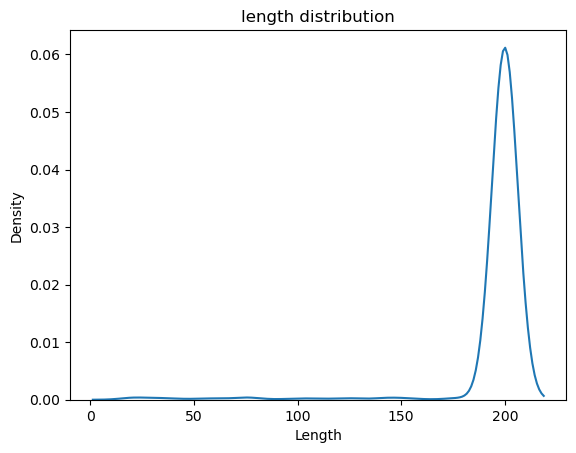

In [305]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure()
sns.kdeplot(x= df_cfs_in['Length'],data = df_cfs_in).set_title('length distribution')
plt.show()

In [306]:
df_cfs_in['New Conversation'].value_counts()

New Conversation
1    508
0    269
Name: count, dtype: int64

In [307]:
df_cfs_in['Direction'].value_counts()

Direction
Inbound    777
Name: count, dtype: int64

In [308]:
stpwrd = nltk.corpus.stopwords.words('english')

stpwrd[:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [309]:
count_vectorizer = CountVectorizer(stop_words=stpwrd)

In [310]:
counts = count_vectorizer.fit_transform(corpus)

In [311]:
counts_df =  pd.DataFrame(counts.toarray(), columns = count_vectorizer.get_feature_names_out())
counts_df.head()

aa  abbey  abi  able  abou  abraham  abroad  accept  acceptable  accepted  \
0   0      0    0     0     0        0       0       0           0         0   
1   0      0    0     0     0        0       0       0           0         0   
2   0      0    0     0     0        0       0       0           0         0   
3   0      0    0     0     0        0       0       0           0         0   
4   0      0    0     0     0        0       0       0           0         0   

   access  accessory  accidentally  accomadation  accommodation  accompany  \
0       0          0             0             0              0          0   
1       0          0             0             0              0          0   
2       0          0             0             0              0          0   
3       0          0             0             0              0          0   
4       0          0             0             0              0          0   

   according  accordingly  accoun  account  accountingbycomputer  ackers  \
0          0            0       0        0                     0       0   
1          0            0       0        0                     0       0   
2          0            0       0        0                     0       0   
3          0            0       0        0                     0       0   
4          0            0       0        0                     0       0   

   acknowledge  acolade  across  action  actioned  activate  active  actual  \
0            0        0       0       0         0         0       0       0   
1            0        0       0       0         0         0       0       0   
2            0        0       0       0         0         0       0       0   
3            0        0       0       0         0         0       0       0   
4            0        0       0       0         0         0       0       0   

   actually  ad  add  added  addition  additional  address  addressed  adeney  \
0         0   1    0      0         0           0        0          0       0   
1         0   1    1      0         0           0        0          0       0   
2         0   1    0      0         0           0        0          0       0   
3         0   0    0      0         0           0        0          0       0   
4         0   1    0      0         0           0        0          0       0   

   adjust  admin  administrator  adria  adrian  adrianhousby  adve  advert  \
0       0      0              0      1       0             0     0       0   
1       0      0              0      0       0             0     0       0   
2       0      0              0      0       0             0     0       0   
3       0      0              0      0       0             0     0       0   
4       0      0              0      0       0             0     0       1   

   adverti  advertis  advertise  advertised  advertisement  advertiser  \
0        0         0          0           0              0           0   
1        0         0          0           0              0           0   
2        0         0          0           0              0           0   
3        0         0          0           0              0           0   
4        0         0          0           0              0           0   

   advertising  advertisment  advice  advise  advised  advising  advisor  \
0            0             0       0       0        0         0        0   
1            0             0       0       0        0         0        0   
2            0             0       0       0        0         0        0   
3            0             0       0       0        0         0        0   
4            0             0       0       0        0         0        0   

   advisory  aewright  affinity  afternoon  ag  agains  age  agent  ago  \
0         0         0         0          0   0       0    0      0    0   
1         0         0         0          0   0       0    0      0    0   
2         0         0         0       

In [312]:
# counting terms
counts_dict = {}

# Store the words as key-value pairs
for ii, word in enumerate(counts_df.columns):
    counts_dict[word] = sum(counts_df[str(word)])
    word_count = [(i,count) for i,count in list(zip(counts_dict.keys(), counts_dict.values()))]

In [313]:
sorted_counts = sorted(word_count, key = lambda x: x[1], reverse = True)
sorted_counts[:40]

[('message', 768),
 ('ad', 580),
 ('email', 472),
 ('name', 391),
 ('new', 390),
 ('received', 382),
 ('id', 369),
 ('com', 314),
 ('uk', 263),
 ('hi', 258),
 ('co', 253),
 ('support', 247),
 ('caravansforsale', 246),
 ('caravan', 223),
 ('please', 188),
 ('advert', 166),
 ('sent', 153),
 ('log', 150),
 ('thank', 131),
 ('gmail', 116),
 ('visit', 114),
 ('sale', 112),
 ('thanks', 108),
 ('hotmail', 88),
 ('wrote', 87),
 ('see', 73),
 ('hello', 65),
 ('miss', 58),
 ('sold', 58),
 ('add', 57),
 ('would', 52),
 ('regard', 51),
 ('paid', 50),
 ('cf', 49),
 ('many', 49),
 ('motorhome', 46),
 ('reply', 46),
 ('site', 45),
 ('follow', 43),
 ('btinternet', 42)]

# <div class = 'alert alert-success'>Horsemart</div>

# Live Chat - Horsemart

In [314]:
df_hm = df[df['Inbox']=='Live Chat - Horsemart']

In [315]:
df_hm.shape

(2268, 26)

In [316]:
df_hm['Length'] = df_hm['Extract'].str.len()

In [317]:
df_hm_chats = df_hm[['Message ID','Extract']]

In [318]:
df_hm_chats.head()

,Message ID,Extract
30,34816911748,"Hi, what is the cost to advertise a trailer pl..."
31,34816912004,"Hi, thanks for contacting us, sorry but we are..."
124,34829981316,hi
125,34829983172,help
297,34838013764,"Hello and thank you for your message, welcome ..."


In [319]:
# Lemmatize
lemmatizer = WordNetLemmatizer()

In [320]:
df_hm['Direction'].value_counts()

Direction
Outbound    1469
Inbound      799
Name: count, dtype: int64

In [321]:
df_hm_in = df_hm[df_hm['Direction']=='Inbound']

In [322]:
df_hm_in.shape

(799, 27)

In [323]:
corpus_dump = list(df_hm_in['Extract'])
corpus_dump

['Hi, what is the cost to advertise a trailer please',
 'hi',
 'help',
 'hi',
 'ive sold my item and would like the advert taken of the webpage please ',
 "My add doesn't seem to have gone live, it still says this advert is currently under our review and it only seems to have uploaded 1 photo instead of all of them.  ",
 "ad ref. HM3019179, my advert doesn't appear to have gone live it states, this advert is currently under our review. angiemcalpine@googlemail.com ",
 'i need help looking for a horse near me ',
 'hello',
 'buntingford',
 'thx',
 'or hertford shire so south east',
 'no spesfic but over 12 hands and ridden',
 'i need horses for loan max £60',
 'is that for horses avalible for loan?',
 'is the anyother websites i could look at?',
 'no thank you if i find anything i will ask',
 'and u',
 'sorry how do i place an add for horses wanted',
 'ello?',
 'yeah',
 'done',
 'yeah',
 'can u hel me find a horse near me to loan for under 100 pounds',
 'help',
 'Hin',
 'Hi',
 'Hi',
 'Hi

In [324]:
corpus = []

text = list(df_hm_in['Extract'])

for i in range(len(text)):
    r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
    r = r.lower()
    r = r.split()
    r = [word for word in r if word not in stopwords.words('english')]
    r = [lemmatizer.lemmatize(word) for word in r]
    r = ' '.join(r)
    corpus.append(r)

In [325]:
corpus

['hi cost advertise trailer please',
 'hi',
 'help',
 'hi',
 'ive sold item would like advert taken webpage please',
 'add seem gone live still say advert currently review seems uploaded photo instead',
 'ad ref hm advert appear gone live state advert currently review angiemcalpine googlemail com',
 'need help looking horse near',
 'hello',
 'buntingford',
 'thx',
 'hertford shire south east',
 'spesfic hand ridden',
 'need horse loan max',
 'horse avalible loan',
 'anyother website could look',
 'thank find anything ask',
 'u',
 'sorry place add horse wanted',
 'ello',
 'yeah',
 'done',
 'yeah',
 'u hel find horse near loan pound',
 'help',
 'hin',
 'hi',
 'hi',
 'hi ash loking buying horse im concerned seller scam',
 'n nhttps www horsemart co uk top class hh superstar horse n nplease confirm advertised taken',
 'hi think found scammer',
 'hi',
 '',
 'classroom',
 'hello',
 '',
 '',
 'oh robot',
 'ghnv bvn',
 '',
 '',
 '',
 'posted two ad long till go live see yet',
 'sll picture del

In [326]:
from collections import Counter  
  
# counts word frequency 
def count_words(text):                   
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = {}  
    for word in text.split(" "):  
        if word in word_counts:  
            word_counts[word]+= 1 
        else:  
            word_counts[word]= 1 
    return word_counts

In [327]:
def count_words_fast(text):      
    text = text.lower()  
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = Counter(text.split(" "))  
    return word_counts  

In [328]:
count_words(corpus[0])

{'hi': 1, 'cost': 1, 'advertise': 1, 'trailer': 1, 'please': 1}

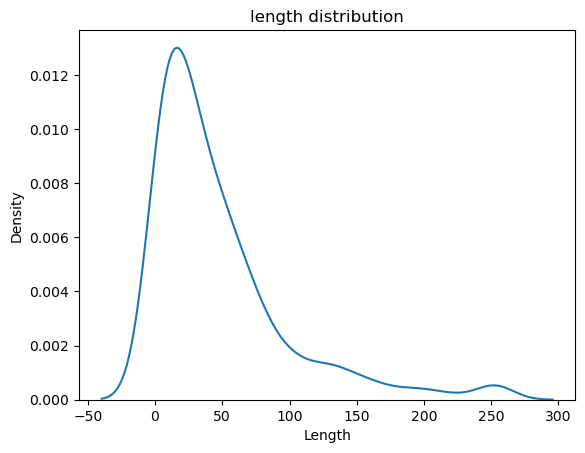

In [329]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure()
sns.kdeplot(x= df_hm_in['Length'],data = df_hm_in).set_title('length distribution')
plt.show()

In [330]:
df_hm_in['New Conversation'].value_counts()

New Conversation
0    637
1    162
Name: count, dtype: int64

In [331]:
df_hm_in['Direction'].value_counts()

Direction
Inbound    799
Name: count, dtype: int64

In [332]:
stpwrd = nltk.corpus.stopwords.words('english')

stpwrd[:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [333]:
count_vectorizer = CountVectorizer(stop_words=stpwrd)

In [334]:
counts = count_vectorizer.fit_transform(corpus)

In [335]:
counts_df =  pd.DataFrame(counts.toarray(), columns = count_vectorizer.get_feature_names_out())
counts_df.head()

,abigailgriffithswhite,able,accept,accepted,access,account,across,active,actually,ad,add,added,adding,address,adhd,adjust,advert,advertise,advertisea,advertised,advertisement,advertising,advis,advise,affecting,afk,afternoon,ago,ahead,ahorse,ajmal,allow,allrounder,along,already,alrounder,also,although,amd,amend,angiemcalpine,another,antoine,antoinefuller,anymore,anyother,anything,anyway,anywhere,aol,apart,apology,appear,appeared,appears,approve,approved,area,arnt,around,arrived,asad,ash,ashmcewan,ask,asked,asking,assist,assumed,atleast,attached,attempting,available,avalible,avwequestrian,awaiting,away,aww,ba,back,bad,banbury,bank,banking,bar,barber,barlow,basic,basically,bcfgofundme,beat,become,beg,begining,believe,bella,bente,best,bill,bit,bitch,black,blank,blocked,bloomfield,bloomin,blue,blurred,body,boost,boosted,bored,box,bramble,breed,briggs,bristol,broodmare,brought,brown,browser,btconnect,btinternet,bu,budget,buntingford,business,buy,buyer,buying,bvn,bye,call,called,came,cancel,candc,candicers,cannot,cant,canter,car,card,care,case,category,cause,cazacross,cbdlimited,certain,certainly,change,changed,changing,charge,charged,chat,check,checked,cheer,chevale,chilver,chilverhouse,choose,chrome,city,class,classroom,clear,click,clicked,close,closely,clydesdale,co,cob,code,colleague,colt,com,come,coming,commit,company,competing,complete,completed,concerned,condition,confirm,confirmation,confrimation,confused,confusing,connemara,considering,contact,contacted,contacting,continue,conversation,copied,copy,copying,correct,cost,could,couldnt,counting,county,couple,crash,create,created,creation,credit,curlykate,current,currently,customer,da,daisy,dated,daughter,davidbellenger,davy,day,dead,dear,debit,deducted,delete,deleted,deliver,den,desperately,despite,destroyed,detail,di,dianashaw,dianne,diannemaullin,different,disappeared,doesnt,done,donna,donnadavies,dont,double,draft,draught,dresarge,drymen,dundee,duplicating,earlier,east,edit,edited,either,elinkindstrand,elite,ello,ellwood,else,email,emailing,emmaatpenrhos,end,ennie,enny,enough,enquired,enquiry,entered,equi,equine,equipment,equitrek,erica,error,europe,even,evening,event,eventually,every,everytime,example,exceed,excellent,excuse,existing,expired,explain,explosive,extra,failure,family,fantastic,far,farrugia,faulty,fe,feb,fee,feedback,festival,ff,ffoa,fill,filled,filli,filling,filter,finacially,find,finding,fine,finished,fiona,first,fisher,fit,five,flash,flick,foo,forward,found,four,free,freeze,freind,fridaymediagroup,friend,ft,full,fuller,fusion,future,garrett,gave,gay,general,georgeacherrell,get,getting,ghnv,gillian,give,given,giving,glasgow,gmail,go,going,gone,gonna,good,google,googlemail,got,graftonstreet,gray,great,green,gregory,greyed,gypsy,hallo,hand,handle,hang,happened,happening,happens,happy,hardman,hasnt,hat,havent,havnt,hear,height,hel,hello,help,helpful,helping,hemp,hence,hertford,hey,hh,hi,higher,hin,hirse,hiya,hm,hola,hold,holliman,holmes,hope,hopefully,horse,horsebox,horseboxesukltd,horsemart,horsepower,horsis,horst,hose,hotmail,hour,house,however,hr,http,hughes,icloud,id,idea,ideally,ill,im,image,impression,improved,include,included,including,incorrect,individual,info,inform,information,input,instead,interested,international,ipad,irish,ish,isnt,issue,item,ive,ives,jenny,jennybattell,joanne,jones,juliabooth,jump,jumping,keep,kielands,kind,kira,know,lancashire,laptop,large,last,latest,laura,lead,leanne,leather,left,legitimate,let,letting,liberte,licence,like,limiting,line,link,list,listed,little,live,load,loaded,loading,loan,location,log,logged,login,loking,long,look,looked,lookin,looking,lorry,lost,lot,love,loved,lovely,low,luke,made,main,make,mallard,man,manage,managed,many,marckosregina,mare,mark,marlow,master,matthew,max,may,maybe,mayor,mb,mean,meaning,meant,melanie,melaniewkfoo,message,messaged,might,millie,mind,mine,minute,missing,mistake,mobile,moment,monday,money,monitor,month,monthly,morning,move,msn,much,multiple,must,nag,name,nan,nand,near,need,needed,nev

In [336]:
# counting terms
counts_dict = {}

# Store the words as key-value pairs
for ii, word in enumerate(counts_df.columns):
    counts_dict[word] = sum(counts_df[str(word)])
    word_count = [(i,count) for i,count in list(zip(counts_dict.keys(), counts_dict.values()))]

In [337]:
sorted_counts = sorted(word_count, key = lambda x: x[1], reverse = True)
sorted_counts[:40]

[('advert', 103),
 ('ad', 97),
 ('hi', 76),
 ('horse', 61),
 ('thank', 60),
 ('please', 54),
 ('thanks', 51),
 ('ok', 46),
 ('com', 42),
 ('page', 39),
 ('add', 37),
 ('get', 32),
 ('photo', 32),
 ('still', 31),
 ('email', 30),
 ('help', 30),
 ('one', 30),
 ('yes', 30),
 ('live', 28),
 ('hello', 27),
 ('see', 26),
 ('paid', 25),
 ('hm', 24),
 ('contact', 22),
 ('want', 22),
 ('put', 19),
 ('need', 18),
 ('tried', 18),
 ('number', 17),
 ('trying', 17),
 ('back', 16),
 ('gmail', 16),
 ('go', 16),
 ('many', 16),
 ('would', 16),
 ('like', 15),
 ('nan', 15),
 ('place', 15),
 ('ref', 15),
 ('account', 13)]

# Email - Horsemart

In [338]:
df_hm = df[df['Inbox']=='Email - Horsemart']

In [339]:
df_hm.shape

(1497, 26)

In [340]:
df_hm['Length'] = df_hm['Extract'].str.len()

In [341]:
df_hm_chats = df_hm[['Message ID','Extract']]

In [342]:
df_hm_chats.head()

,Message ID,Extract
21,34815417796,You have received a new message. Name: Charles...
32,34816948676,"Hi, thanks for contacting us, sorry but we are..."
33,34817426116,You have received a new message. Name: Sarah R...
93,34823977412,You have received a new message. Name: Jas Sin...
126,34830068740,You have received a new message. Name: Stuart ...


In [343]:
# Lemmatize
lemmatizer = WordNetLemmatizer()

In [344]:
df_hm['Direction'].value_counts()

Direction
Outbound    826
Inbound     671
Name: count, dtype: int64

In [345]:
df_hm_in = df_hm[df_hm['Direction']=='Inbound']

In [346]:
df_hm_in.shape

(671, 27)

In [347]:
corpus_dump = list(df_hm_in['Extract'])
corpus_dump

['You have received a new message. Name: Charles Stocks Email: charles@v8mg.com Ad ID: ad ref. HM2262590 Message: Dear horsemart Re ad ref. HM2262590 My horse box sold last summer but I am still receivi',
 "You have received a new message. Name: Sarah Read Email: sarahquickwood@tiscali.co.uk Ad ID: Message: I'm searching for a Connemara-thoroughbred cross horse to purchase in the spring. I've tried putti",
 'You have received a new message. Name: Jas Singh Email: sales@equinequality.com Ad ID: Message: Hi We are an advertiser on your platform under CPL Global Ltd t/a Equine Quality (EQ). As most of our Ho',
 "You have received a new message. Name: Stuart norcross Email: x.stuart2012.x@hotmail.co.uk Ad ID: HM3019059 Message: It’s Charge me twice for my advert Log in now Visit Horsemart Don't miss out! Follo",
 "You have received a new message. Name: Sian Gaughan Email: sian.gaughan@thinklikeapony.co.uk Ad ID: Message: Good morning, I hope you had a great Christmas and Happy New Year! I'

In [348]:
corpus = []

text = list(df_hm_in['Extract'])

for i in range(len(text)):
    r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
    r = r.lower()
    r = r.split()
    r = [word for word in r if word not in stopwords.words('english')]
    r = [lemmatizer.lemmatize(word) for word in r]
    r = ' '.join(r)
    corpus.append(r)

In [349]:
corpus

['received new message name charles stock email charles v mg com ad id ad ref hm message dear horsemart ad ref hm horse box sold last summer still receivi',
 'received new message name sarah read email sarahquickwood tiscali co uk ad id message searching connemara thoroughbred cross horse purchase spring tried putti',
 'received new message name jas singh email sale equinequality com ad id message hi advertiser platform cpl global ltd equine quality eq ho',
 'received new message name stuart norcross email x stuart x hotmail co uk ad id hm message charge twice advert log visit horsemart miss follo',
 'received new message name sian gaughan email sian gaughan thinklikeapony co uk ad id message good morning hope great christmas happy new year emailing query th',
 'hello first payment pony advert appear go pay pal timed see anything happened paid e mail thanking payment',
 'received new message name jp email jpwilliams icloud com ad id message would like advertise horsebox log visit horse

In [350]:
from collections import Counter  
  
# counts word frequency 
def count_words(text):                   
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = {}  
    for word in text.split(" "):  
        if word in word_counts:  
            word_counts[word]+= 1 
        else:  
            word_counts[word]= 1 
    return word_counts

In [351]:
def count_words_fast(text):      
    text = text.lower()  
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = Counter(text.split(" "))  
    return word_counts  

In [352]:
count_words(corpus[0])

{'received': 1,
 'new': 1,
 'message': 2,
 'name': 1,
 'charles': 2,
 'stock': 1,
 'email': 1,
 'v': 1,
 'mg': 1,
 'com': 1,
 'ad': 3,
 'id': 1,
 'ref': 2,
 'hm': 2,
 'dear': 1,
 'horsemart': 1,
 'horse': 1,
 'box': 1,
 'sold': 1,
 'last': 1,
 'summer': 1,
 'still': 1,
 'receivi': 1}

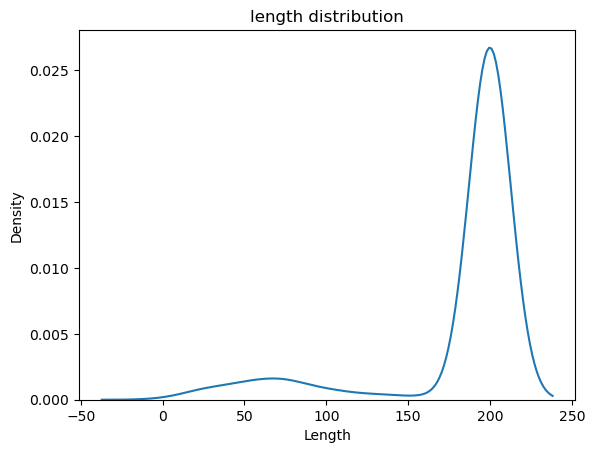

In [353]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure()
sns.kdeplot(x= df_hm_in['Length'],data = df_hm_in).set_title('length distribution')
plt.show()

In [354]:
df_hm_in['New Conversation'].value_counts()

New Conversation
1    612
0     59
Name: count, dtype: int64

In [355]:
df_hm_in['Direction'].value_counts()

Direction
Inbound    671
Name: count, dtype: int64

In [356]:
stpwrd = nltk.corpus.stopwords.words('english')

stpwrd[:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [357]:
count_vectorizer = CountVectorizer(stop_words=stpwrd)

In [358]:
counts = count_vectorizer.fit_transform(corpus)

In [359]:
counts_df =  pd.DataFrame(counts.toarray(), columns = count_vectorizer.get_feature_names_out())
counts_df.head()

aa  abbie  abbieemms  abc  abided  able  ac  aca  accept  acceptin  \
0   0      0          0    0       0     0   0    0       0         0   
1   0      0          0    0       0     0   0    0       0         0   
2   0      0          0    0       0     0   0    0       0         0   
3   0      0          0    0       0     0   0    0       0         0   
4   0      0          0    0       0     0   0    0       0         0   

   accepting  accessing  accide  accident  account  accountant  acdf  ace  \
0          0          0       0         0        0           0     0    0   
1          0          0       0         0        0           0     0    0   
2          0          0       0         0        0           0     0    0   
3          0          0       0         0        0           0     0    0   
4          0          0       0         0        0           0     0    0   

   across  activate  active  ad  adam  add  added  adding  additional  \
0       0         0       0   3     0    0      0       0           0   
1       0         0       0   1     0    0      0       0           0   
2       0         0       0   1     0    0      0       0           0   
3       0         0       0   1     0    0      0       0           0   
4       0         0       0   1     0    0      0       0           0   

   address  ade  adele  administrator  adrian  adv  advally  advance  adve  \
0        0    0      0              0       0    0        0        0     0   
1        0    0      0              0       0    0        0        0     0   
2        0    0      0              0       0    0        0        0     0   
3        0    0      0              0       0    0        0        0     0   
4        0    0      0              0       0    0        0        0     0   

   adver  advert  advertise  advertised  advertisement  advertiser  \
0      0       0          0           0              0           0   
1      0       0          0           0              0           0   
2      0       0          0           0              0           1   
3      0       1          0           0              0           0   
4      0       0          0           0              0           0   

   advertising  advi  advice  advise  advised  adx  ae  aed  aela  af  aft  \
0            0     0       0       0        0    0   0    0     0   0    0   
1            0     0       0       0        0    0   0    0     0   0    0   
2            0     0       0       0        0    0   0    0     0   0    0   
3            0     0       0       0        0    0   0    0     0   0    0   
4            0     0       0       0        0    0   0    0     0   0    0   

   afternoon  ago  ahopewel  ailsa  aint  aitchison  ajmal  al  alarna  alert  \
0          0    0         0      0     0          0      0   0       0      0   
1          0    0         0      0     0          0      0   0       0      0   
2          0    0         0      0     0          0      0   0       0      0   
3          0    0         0      0     0          0      0   0       0      0   
4          0    0         0      0     0          0      0   0       0      0   

   alessia  alex  alexander  alexdoe  alice  alicia  aliciaballshowjumping  \
0        0     0          0        0      0       0                      0   
1        0     0          0        0      0       0                      0   
2        0     0          0        0      0       0                      0   
3        0     0          0        0      0       0                      0   
4        0     0          0        0      0       0                      0   

   aliciasibley  alik  alison  alisonjaynefitzgibbons  allan  allen  allocate  \
0             0     0       0                       0      0      0         0   
1             0     0       0                       0      0      0         0   
2             0     0       0                       0      0      0         0   
3             0     0  

In [360]:
# counting terms
counts_dict = {}

# Store the words as key-value pairs
for ii, word in enumerate(counts_df.columns):
    counts_dict[word] = sum(counts_df[str(word)])
    word_count = [(i,count) for i,count in list(zip(counts_dict.keys(), counts_dict.values()))]

In [361]:
sorted_counts = sorted(word_count, key = lambda x: x[1], reverse = True)
sorted_counts[:60]

[('message', 1079),
 ('ad', 745),
 ('email', 612),
 ('new', 542),
 ('received', 541),
 ('id', 533),
 ('name', 533),
 ('com', 394),
 ('advert', 255),
 ('hi', 233),
 ('gmail', 180),
 ('hm', 178),
 ('uk', 166),
 ('co', 165),
 ('log', 146),
 ('horsemart', 143),
 ('please', 141),
 ('visit', 117),
 ('hotmail', 106),
 ('horse', 98),
 ('sent', 74),
 ('miss', 70),
 ('hello', 66),
 ('verify', 59),
 ('paid', 56),
 ('add', 53),
 ('trying', 53),
 ('placed', 52),
 ('thanks', 52),
 ('follow', 49),
 ('outlook', 48),
 ('yahoo', 45),
 ('tried', 43),
 ('account', 41),
 ('still', 41),
 ('place', 39),
 ('could', 38),
 ('live', 38),
 ('good', 35),
 ('thank', 35),
 ('like', 34),
 ('one', 34),
 ('would', 32),
 ('payment', 31),
 ('iphone', 30),
 ('need', 30),
 ('photo', 30),
 ('taken', 29),
 ('regard', 28),
 ('morning', 26),
 ('see', 26),
 ('btinternet', 25),
 ('many', 25),
 ('scam', 25),
 ('sale', 24),
 ('get', 23),
 ('icloud', 23),
 ('ref', 23),
 ('say', 23),
 ('sold', 23)]

# <div class = 'alert alert-success'>Horseclicks</div>

In [362]:
df['Inbox'].value_counts()

Inbox
Live Chat - FAD             23690
Callbacks                    7171
Email - FAD                  6337
Live Chat - Wightbay         6110
Email - Internet Support     3030
Email - Gunstar              2793
Live Chat - Caravans         2738
Live Chat - Gunstar          2386
Live Chat - Horsemart        2268
Email - Horseclicks          2094
Email - Caravans             1668
Email - Horsemart            1497
Live Chat - Horseclicks       617
Email - Wightbay              612
Email - UpCountry             552
Email - Birdtrader            510
Email - Dogs & Puppies        241
Email - Kitten Ads            175
Spidersnet - 999               24
Spidersnet Support             19
Email - BS24Support             1
Name: count, dtype: int64

# Live Chat - Horseclicks

In [363]:
df_hc = df[df['Inbox']=='Live Chat - Horseclicks']

In [364]:
df_hc.shape

(617, 26)

In [365]:
df_hc['Length'] = df_hc['Extract'].str.len()

In [366]:
df_hc_chats = df_hc[['Message ID','Extract']]

In [367]:
df_hc_chats.head()

,Message ID,Extract
2093,34966830660,NaN
2094,34966843972,Please elaborate your concern ?
2095,34966837700,"Hello and thank you for your message, welcome ..."
2105,34967288068,"Hi, I've noticed you haven't responded for a w..."
2318,34992527748,Yes I’m interested in a trailer I saw


In [368]:
# Lemmatize
lemmatizer = WordNetLemmatizer()

In [369]:
df_hc['Direction'].value_counts()

Direction
Outbound    387
Inbound     230
Name: count, dtype: int64

In [370]:
df_hc_in = df_hc[df_hc['Direction']=='Inbound']

In [371]:
df_hc_in.shape

(230, 27)

In [372]:
corpus_dump = list(df_hc_in['Extract'])
corpus_dump

[nan,
 'Yes I’m interested in a trailer I saw',
 'How do I contact someone about more pictures of a trailer ',
 'HT252902F',
 'Thank you',
 'Do I have to have a account to do that',
 'Nope that’s all thank you so much',
 'can the horse lower the price',
 "Hi I accidentally upgraded the wrong property yesterday, I canceled it and added the correct property and upgraded that one. Is there anyway I can get reimbursed or credited back the $35 from yesterday? it was for the Vineyard's property.",
 'email@realtyhive.com',
 'Sorry let me double check',
 'Oh I just sign in with my username which is RealtyHive',
 'It was paid with a credit card yesterday ending in 1153 - I am wondering if we can get a refund ',
 "I upgraded the correct property today and re-paid another $35 because I didn't see a way to transfer the credit.",
 'Ok, thank you very much.',
 "Is email@realtyhive associated with my account then? If you couldn't find it? ",
 'Perfect, I appreciate your help. ',
 'No thank you',
 'Yo

In [373]:
corpus = []

text = list(df_hc_in['Extract'])

for i in range(len(text)):
    r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
    r = r.lower()
    r = r.split()
    r = [word for word in r if word not in stopwords.words('english')]
    r = [lemmatizer.lemmatize(word) for word in r]
    r = ' '.join(r)
    corpus.append(r)

In [374]:
corpus

['nan',
 'yes interested trailer saw',
 'contact someone picture trailer',
 'ht f',
 'thank',
 'account',
 'nope thank much',
 'horse lower price',
 'hi accidentally upgraded wrong property yesterday canceled added correct property upgraded one anyway get reimbursed credited back yesterday vineyard property',
 'email realtyhive com',
 'sorry let double check',
 'oh sign username realtyhive',
 'paid credit card yesterday ending wondering get refund',
 'upgraded correct property today paid another see way transfer credit',
 'ok thank much',
 'email realtyhive associated account find',
 'perfect appreciate help',
 'thank',
 'bye bye',
 'hi one question thought upgraded elite also chose banner ad see elite charge verify went',
 'ok still add banner ad',
 'see option anymore though',
 'interesting shown option maybe end charging',
 'strange suppose long charge fine maybe mention department used option still showing option last night thismorning',
 'screenshot entered property show saw',
 'n

In [375]:
from collections import Counter  
  
# counts word frequency 
def count_words(text):                   
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = {}  
    for word in text.split(" "):  
        if word in word_counts:  
            word_counts[word]+= 1 
        else:  
            word_counts[word]= 1 
    return word_counts

In [376]:
def count_words_fast(text):      
    text = text.lower()  
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = Counter(text.split(" "))  
    return word_counts  

In [377]:
count_words(corpus[0])

{'nan': 1}

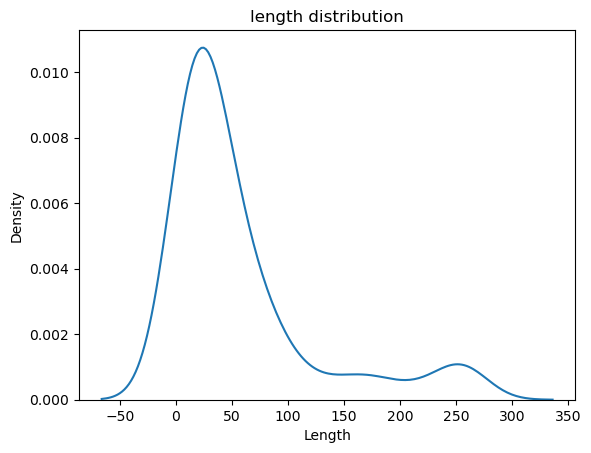

In [378]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure()
sns.kdeplot(x= df_hc_in['Length'],data = df_hc_in).set_title('length distribution')
plt.show()

In [379]:
df_hc_in['New Conversation'].value_counts()

New Conversation
0    187
1     43
Name: count, dtype: int64

In [380]:
df_hc_in['Direction'].value_counts()

Direction
Inbound    230
Name: count, dtype: int64

In [381]:
stpwrd = nltk.corpus.stopwords.words('english')

stpwrd[:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [382]:
count_vectorizer = CountVectorizer(stop_words=stpwrd)

In [383]:
counts = count_vectorizer.fit_transform(corpus)

In [384]:
counts_df =  pd.DataFrame(counts.toarray(), columns = count_vectorizer.get_feature_names_out())
counts_df.head()

,aaetujwodyiqwklwywdufhzeaddejkaje,ab,abuse,accidentally,account,ad,add,added,additional,address,adjust,adrienne,aiproiuyutfderiruyfdewksldihrtgdfkshjfhdshcvjfdejhgjgldsajdhufdfrgbv,ajmal,alisha,allow,allowing,allrounder,also,analysis,anjaw,another,anymore,anyone,anything,anyway,aol,appears,appreciate,approval,approve,asheville,asked,asking,associated,att,auction,authority,available,back,backlinks,bank,banner,believe,better,bhlklgb,bidding,bing,black,blank,block,blocked,bob,bold,booster,boosting,briefly,build,buried,business,buy,bye,ca,call,called,canceled,cant,caravan,card,category,change,changed,charge,charged,charging,chat,chatting,check,chose,cksccom,click,clicked,com,competitive,consign,contact,contacted,containing,content,continue,cookie,cooky,coonce,correct,country,craiglist,credit,credited,cross,daughter,day,ddrefrsrejwhuiu,department,deposit,description,desginer,desiner,dfgtsrfjhrsjrezsrfdgfvxfrkgeadckgfvdvfgfsmfnbdxnkjgfbkzfvbfvfvdvfvdf,dfhgjsahjsa,dfjedjsasbs,dfkdcvjahsdjhlwdefiuqaewsdcieh,different,difioshdluslik,dispute,dohmkeir,domain,dont,double,draft,dreamhorseranch,dressage,drop,dvteiodpiforiuwkkwuso,ed,edcbabsvledsjkjl,edit,egrsdfxrgdfjcfswager,elite,else,email,emoti,end,ending,enter,entered,er,erfserfiseizseufydysedfhwsu,ertruwtffgotgifoghbh,etc,even,ewuofgekdjfrwufgfiewuyruirdskdhfijwedsuip,expecting,expert,facebook,fails,false,farm,fegafredfhfeqdcghdgfrgiegdjsdfiucaadfvffdfgadsusgdfdgfxhcfdcxdfvygeada,fgertgjedjcyjwsydtfyfwqshadkreswyehklredlfy,fhjszhdkjhuqshdfhga,figured,find,fine,first,fix,fixed,fjrvfhr,fogiflidfkhvhkfokpfofkhkdjrlfffffood,follow,following,fonf,food,foxtrotter,friend,friendly,friesian,frustrating,fsya,ftrtuyuryyil,fueopio,function,future,gave,general,get,getting,ghl,give,given,gjhhkjoiijhjkg,glitch,gmail,go,going,good,got,great,guoljuuyhguyi,guyto,gvh,gws,hand,happens,hart,hat,havent,hello,help,helping,hi,high,hit,hliouiuiiouyiuuihiu,hnl,hold,hope,hopefully,horse,horseclic,horseclicks,horseporium,hostage,hour,however,hqeklg,ht,im,image,immediately,important,improve,india,info,information,instagram,interested,interesting,ioiseiljsi,issue,jasdjwedfg,jdrfrejfkjehdfjhwskdvjssdj,jeremiah,jsadvjefuatergfjsanefkherjkdsjwiejrgkedsh,justin,kabhomes,keep,kelly,kemp,keywords,kill,killbuyer,know,krolewna,labeled,last,leave,let,letting,like,limited,line,link,list,listed,listing,littletranch,live,living,lnlb,load,log,long,look,looking,lower,lrirgrttrgdlrrgkejhgjxfrrfsfbrhefkdgjfrg,made,make,manual,many,marjm,mark,may,maybe,mention,message,might,mine,missouri,misspelled,mom,money,monthly,moved,mr,much,must,nalls,name,named,nan,nationwide,nc,need,neglect,net,new,ng,ngoogle,ngreeting,nhttps,ni,nice,nif,night,nnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnn,nope,noticed,number,offer,oh,oiuqpfuruygtqioplie,ojdhef,ok,okay,one,online,open,opi,option,order,organic,ostly,otherwise,owns,package,page,paid,paint,pen,people,perfect,perhaps,permanent,person,pey,phone,photo,pic,picture,place,placed,placement,plan,playing,please,pol,post,posted,price,problem,process,prof,proof,property,provide,purchase,purebr,putting,quality,quarter,question,rating,reached,reactivate,realized,realtorphillis,realtyhive,reason,receive,received,reeting,refund,regular,reimbursed,remove,replied,reply,replying,research,respond,response,result,rfgssr,rfi,rick,rickcoonce,ride,rideandglide,right,rrfawdefjedhqioaisfovbhpdhksdfkeruhdljier,saddle,sale,sami,saw,say,scam,screen,screenshot,sdjvkashojaewsasidjedkhjshhssjjcdyciwajedishdklfiuyduisl,se,search,see,seeing,seems,select,sell,seller,send,sending,sent,seo,service,setting,several,show,showing,shown,sicvoisehdiohodsedfsdjewjiyhkffiwatew,side,sign,site,skdljrhwgastjk,soedfuiterufd,sold,someone,something,sorry,sound,specific,specifically,srikeddktgugvidufopjktgrjeifgj,starve,state,status,step,still,strange,submitted,suiewkswdfgueridjslr,superslow,suppose,sure,svledlwerws,sweet,take,taking,talk,texas,text,tfh,tgdret,tgrfdirwefgrkehfdjle,thank,thanks,thats,think,thismorning,though,thought,tickcreekranch,time,

In [385]:
# counting terms
counts_dict = {}

# Store the words as key-value pairs
for ii, word in enumerate(counts_df.columns):
    counts_dict[word] = sum(counts_df[str(word)])
    word_count = [(i,count) for i,count in list(zip(counts_dict.keys(), counts_dict.values()))]

In [386]:
sorted_counts = sorted(word_count, key = lambda x: x[1], reverse = True)
sorted_counts[:40]

[('horse', 30),
 ('ad', 29),
 ('trailer', 25),
 ('add', 20),
 ('com', 19),
 ('email', 15),
 ('search', 15),
 ('see', 14),
 ('show', 13),
 ('thank', 13),
 ('ok', 11),
 ('option', 11),
 ('help', 10),
 ('ht', 9),
 ('know', 9),
 ('want', 9),
 ('hart', 8),
 ('hello', 8),
 ('hi', 8),
 ('number', 8),
 ('please', 8),
 ('yes', 8),
 ('contact', 7),
 ('screenshot', 7),
 ('still', 7),
 ('yahoo', 7),
 ('account', 6),
 ('elite', 6),
 ('get', 6),
 ('make', 6),
 ('send', 6),
 ('yesterday', 6),
 ('call', 5),
 ('correct', 5),
 ('different', 5),
 ('like', 5),
 ('many', 5),
 ('one', 5),
 ('posted', 5),
 ('property', 5)]

# Email - Horseclicks

In [387]:
df_hc = df[df['Inbox']=='Email - Horseclicks']

In [388]:
df_hc.shape

(2094, 26)

In [389]:
df_hc['Length'] = df_hc['Extract'].str.len()

In [390]:
df_hc_chats = df_hc[['Message ID','Extract']]

In [391]:
df_hc_chats.head()

,Message ID,Extract
0,34813192388,I apologize for this automatic reply to your e...
10,34813413444,I apologize for this automatic reply to your e...
12,34813445060,I apologize for this automatic reply to your e...
14,34813893828,I apologize for this automatic reply to your e...
16,34813940548,I apologize for this automatic reply to your e...


In [392]:
# Lemmatize
lemmatizer = WordNetLemmatizer()

In [393]:
df_hc['Direction'].value_counts()

Direction
Inbound     1440
Outbound     654
Name: count, dtype: int64

In [394]:
df_hc_in = df_hc[df_hc['Direction']=='Inbound']

In [395]:
df_hc_in.shape

(1440, 27)

In [396]:
corpus_dump = list(df_hc_in['Extract'])
corpus_dump

['I apologize for this automatic reply to your email. To control spam, I now allow incoming messages only from senders I have approved beforehand. If you would like to be added to my list of approved se',
 'I apologize for this automatic reply to your email. To control spam, I now allow incoming messages only from senders I have approved beforehand. If you would like to be added to my list of approved se',
 'I apologize for this automatic reply to your email. To control spam, I now allow incoming messages only from senders I have approved beforehand. If you would like to be added to my list of approved se',
 'I apologize for this automatic reply to your email. To control spam, I now allow incoming messages only from senders I have approved beforehand. If you would like to be added to my list of approved se',
 'I apologize for this automatic reply to your email. To control spam, I now allow incoming messages only from senders I have approved beforehand. If you would like to be added to 

In [397]:
corpus = []

text = list(df_hc_in['Extract'])

for i in range(len(text)):
    r = re.sub('[^a-zA-Z]', ' ', str(text[i]))
    r = r.lower()
    r = r.split()
    r = [word for word in r if word not in stopwords.words('english')]
    r = [lemmatizer.lemmatize(word) for word in r]
    r = ' '.join(r)
    corpus.append(r)

In [398]:
corpus

['apologize automatic reply email control spam allow incoming message sender approved beforehand would like added list approved se',
 'apologize automatic reply email control spam allow incoming message sender approved beforehand would like added list approved se',
 'apologize automatic reply email control spam allow incoming message sender approved beforehand would like added list approved se',
 'apologize automatic reply email control spam allow incoming message sender approved beforehand would like added list approved se',
 'apologize automatic reply email control spam allow incoming message sender approved beforehand would like added list approved se',
 'apologize automatic reply email control spam allow incoming message sender approved beforehand would like added list approved se',
 'apologize automatic reply email control spam allow incoming message sender approved beforehand would like added list approved se',
 'apologize automatic reply email control spam allow incoming message

In [399]:
from collections import Counter  
  
# counts word frequency 
def count_words(text):                   
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = {}  
    for word in text.split(" "):  
        if word in word_counts:  
            word_counts[word]+= 1 
        else:  
            word_counts[word]= 1 
    return word_counts

In [400]:
def count_words_fast(text):      
    text = text.lower()  
    skips = [".", ", ", ":", ";", "'", '"']  
    for ch in skips:  
        text = text.replace(ch, "")  
    word_counts = Counter(text.split(" "))  
    return word_counts  

In [401]:
count_words(corpus[0])

{'apologize': 1,
 'automatic': 1,
 'reply': 1,
 'email': 1,
 'control': 1,
 'spam': 1,
 'allow': 1,
 'incoming': 1,
 'message': 1,
 'sender': 1,
 'approved': 2,
 'beforehand': 1,
 'would': 1,
 'like': 1,
 'added': 1,
 'list': 1,
 'se': 1}

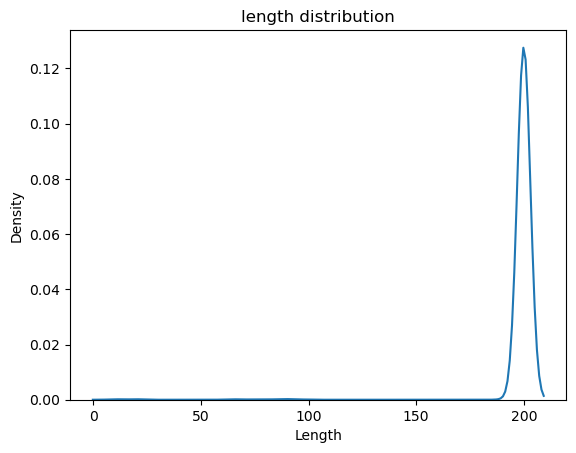

In [402]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure()
sns.kdeplot(x= df_hc_in['Length'],data = df_hc_in).set_title('length distribution')
plt.show()

In [403]:
df_hc_in['New Conversation'].value_counts()

New Conversation
1    799
0    641
Name: count, dtype: int64

In [404]:
df_hc_in['Direction'].value_counts()

Direction
Inbound    1440
Name: count, dtype: int64

In [405]:
stpwrd = nltk.corpus.stopwords.words('english')

stpwrd[:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [406]:
count_vectorizer = CountVectorizer(stop_words=stpwrd)

In [407]:
counts = count_vectorizer.fit_transform(corpus)

In [408]:
counts_df =  pd.DataFrame(counts.toarray(), columns = count_vectorizer.get_feature_names_out())
counts_df.head()

aaf  aardahl  ab  abarcattle  abbostsford  abby  abemillar  abercrombie  \
0    0        0   0           0            0     0          0            0   
1    0        0   0           0            0     0          0            0   
2    0        0   0           0            0     0          0            0   
3    0        0   0           0            0     0          0            0   
4    0        0   0           0            0     0          0            0   

   abernathy  abilene  able  abram  absolutely  ac  accept  accepted  access  \
0          0        0     0      0           0   0       0         0       0   
1          0        0     0      0           0   0       0         0       0   
2          0        0     0      0           0   0       0         0       0   
3          0        0     0      0           0   0       0         0       0   
4          0        0     0      0           0   0       0         0       0   

   accou  account  acct  acknowledge  acount  acre  active  activity  acton  \
0      0        0     0            0       0     0       0         0      0   
1      0        0     0            0       0     0       0         0      0   
2      0        0     0            0       0     0       0         0      0   
3      0        0     0            0       0     0       0         0      0   
4      0        0     0            0       0     0       0         0      0   

   actually  ad  adam  adamson  adayra  add  added  adding  address  \
0         0   0     0        0       0    0      1       0        0   
1         0   0     0        0       0    0      1       0        0   
2         0   0     0        0       0    0      1       0        0   
3         0   0     0        0       0    0      1       0        0   
4         0   0     0        0       0    0      1       0        0   

   addressee  adrees  adrian  adve  adverb  advert  advertise  advertised  \
0          0       0       0     0       0       0          0           0   
1          0       0       0     0       0       0          0           0   
2          0       0       0     0       0       0          0           0   
3          0       0       0     0       0       0          0           0   
4          0       0       0     0       0       0          0           0   

   advertisement  advertiser  advertising  advertisment  advice  advis  \
0              0           0            0             0       0      0   
1              0           0            0             0       0      0   
2              0           0            0             0       0      0   
3              0           0            0             0       0      0   
4              0           0            0             0       0      0   

   advise  adwert  adykstra  aerial  af  affiliated  afraid  afternoon  aga  \
0       0       0         0       0   0           0       0          0    0   
1       0       0         0       0   0           0       0          0    0   
2       0       0         0       0   0           0       0          0    0   
3       0       0         0       0   0           0       0          0    0   
4       0       0         0       0   0           0       0          0    0   

   agenciasubido  agent  ago  agree  agreed  ahold  ajmal  ajoperry  ajrealty  \
0              0      0    0      0       0      0      0         0         0   
1              0      0    0      0       0      0      0         0         0   
2              0      0    0      0       0      0      0         0         0   
3              0      0    0      0       0      0      0         0         0   
4              0      0    0      0       0      0      0         0         0   

   al  alana  alberto  alert  alford  alfords  alison  allan  alle  allen  \
0   0      0        0      0       0        0       0      0     0      0   
1   0      0        0      0       0        0       0      0     0      0   
2   0      0        0      0       0        0     

In [409]:
# counting terms
counts_dict = {}

# Store the words as key-value pairs
for ii, word in enumerate(counts_df.columns):
    counts_dict[word] = sum(counts_df[str(word)])
    word_count = [(i,count) for i,count in list(zip(counts_dict.keys(), counts_dict.values()))]

In [410]:
sorted_counts = sorted(word_count, key = lambda x: x[1], reverse = True)
sorted_counts[:40]

[('message', 1688),
 ('email', 1130),
 ('approved', 1032),
 ('ad', 895),
 ('com', 757),
 ('received', 583),
 ('would', 570),
 ('like', 566),
 ('reply', 566),
 ('name', 562),
 ('new', 554),
 ('list', 541),
 ('automatic', 537),
 ('id', 530),
 ('allow', 525),
 ('added', 524),
 ('apologize', 523),
 ('control', 523),
 ('incoming', 523),
 ('spam', 523),
 ('se', 522),
 ('sender', 519),
 ('beforehand', 514),
 ('horseclicks', 451),
 ('gmail', 254),
 ('horse', 241),
 ('support', 230),
 ('log', 192),
 ('hi', 162),
 ('visit', 162),
 ('please', 159),
 ('sent', 137),
 ('ht', 129),
 ('wrote', 128),
 ('thank', 125),
 ('miss', 117),
 ('yahoo', 115),
 ('add', 87),
 ('follow', 84),
 ('info', 78)]

# <div class = 'alert alert-info'> INSIGHTS </div>

# FAD - Livechat insights
Questions
- Does outbound-VS-inbound messages count have any impact on Customer satisfaction or User conversion?
     - No data available to determine the above. 

- The lengthy messages are being cut short in "Extract". Will this negatively impact the analysis?
     - The answer is likely to be "NO". The inbound lengthy messages make up a very small segment of the total messages. Can be overlooked.


Insights
- Lengthy messages (Over 150 characters) are ususlly outbound messages.
- Outbound vs Inbound
    - Live Chat -> Outbound messages > Inbound messages
    - Email Chat -> Outbound messages < Inbound messages
- Types of inbound queries (in order of most queries) :
    1. Assistance -> payments, Ad modifications, where is my ad, general clarifications (Confusions with ad types), etc.
    2. Issues and support -> Account deactivated, photos related queries, issues with renewal, etc.
    3. Location queries -> inaccurate location support
    4. Complaints
- Majority of the "Extract" messages that have been cropped are default replies set by FAD informing the users that the support team is currently inactive.
    - These messages also make up for the most number of messages sent on FAD - Live chat.

# FAD - email Insights

- For all messages longer than 160 characters, support team has replied.
- For messages sharter than 160 characters, the number of replies is extremely low (1:6)
    - Can these messages be considered as the final "thank you" messages?
    - No. These are mainly verification mails sent by customers.



- Inbound messages are similar to that of FAD - livechat inbound messages. 
- Outbound messages are primarily automated messages, along with query responses.

# Insights - FAD Activities

Questions
- Why are there no Survey ratings? This would help us better understand customer satisfaction.
- Can the support team initiate an outbound contact with a customer, without the customer actually initiating?


Insights
- "Extract" insights for Activities are similar to that of Messages.
- Outbound (Direction) = out_reply + outbound

---

## Gunstar Live - Insights

- Nothing stands out wrt lengths of chats, but the number of outgoing is more than the number of incoming messages, similar to FAD.
- Even the conversations/queries are very similar to that of FAD.
- Popular queries include:
    - Greeting messages (hi, thank you)
    - Ad issues and support
    - payment queries
    - MKP support and reasoning

## Gunstar Mail - Insights

- It is weird that all of the messages sent and received on GS have a length of around 200 characters.
- Includes everything in Gunstar Live along with:
    - Account assistance
    - Business account queries

---

## Wightbay Live - Insights

- The number of outbound messages are twice the number of inbound messages.
- Top Inbound Queries:
    - Advert support
    - Account details and queries
    - Ad details info and payment support

## Wightbay Mail - Insights

- Not many queries here.
- Most of the queries for WB are received through Live chat.

---

## Internet Support - Insights

- At first glance, it seems like most of the messages in Internet support are automated messages.
- But when analysed, the number of the automated messages are negligible.
- Top Inbound Queries include general support queries.

---

## Insights - CFS Live Chat

- CFS live chat queries doesn't follow the pattern of other sites.
- There are not a lot of inbound queries on CFS live chat.
- The ratio of inbound to outbound messages is almost 1:2
- Yet, of the 962 inbound queries, the most popular categories are:
    - Why can't I find my ad when i search?
    - Edit and save ads?
    - Ad posting support and feedbacks
    - Info on ad costs even bofore posting ads

## Insights - CFS Email

- Almost all CFS email messages are cropped at 200 characters.
- Most of the inbound messages include a template that begins with "You have received a new message"
- No notable insights found for this dataset.

---

## Insights - Horsemart Live Chat

- Inbound to outbound ratio is almost 1:2
- There are basically two types of queries on HM:
    - Queries from Sellers
        - Under review
        - Photo errors
        - payment support
    - Queries from buyers
        - Help to find horses/ads near them

## Insights - Horsemart Email

- Most of the inbound emails have a template : "You have received a new message"
- Popular queries through mail include :
    - Delete ads and refund
    - Under review panic
    - Verify advert
    - Ad photos support
    - Receipt for ads
    - Stop auto-renewal
    - Scam reports

---

## Insights - Horseclicks

- Only HC has more Email queries than Live Chat queries when compared to all other sites.
- Very limited data in Live Chats. 

## Insights - HC Email
- There are more Inbound queries than outbound (**Are HC emails being ignored?**) Inbound to outbound  = 2:1
- Data is cropped! Data contains automatic reply template : "I apologise for this automatic reply", "To control spam, I now allow incoming messages only from senders I have approved beforehand", "You have received a new message"
- Out of 1400 inbound queries, more than 500 include automated replies.
- The other common queries include:
    - Do not autorenew
    - Cancel my ad, refund (payments)
    - Ad verification
    - Delete account